# Deep Learning on Human Protein Atlas

#### Nikolay Oskolkov, SciLifeLab, NBIS Long Term Support, [nikolay.oskolkov@scilifelab.se](nikolay.oskolkov@scilifelab.se)

<h3><center>Abstract</center></h3>
Human Protein Atlas (HPA) is an ambitios project aiming to constructing a comprehensive map of expression of all proteins in all cells of all human tissues. Here we will show how to use Convolutional Neural Networks (CNNs) for multi-label multi-class image classification. More specifically, the problem is to assign multiple labels to fluorescence microscopy images of cells depending on in which part of cell the protein is expressed.

### Table of Contents:
* [What Human Protein Atlas is about?](#What-Human-Protein-Atlas-is-about?)
* [What are the Classes in HPA Images?](#What-are-the-Classes-in-HPA-Images?)
* [How do HPA images look like?](#How-do-HPA-images-look-like?)
* [Build Automatic Cell Annotation](#Build-Automatic-Cell-Annotation)
* [Build Manual Cell Annotation](#Build-Manual-Cell-Annotation)
* [Object Detection with Mask-RCNN](#Object-Detection-with-Mask-RCNN)
* [Multi-Label Classification of HPA Images](#Multi-Label-Classification-of-HPA-Images)

### What Human Protein Atlas is about?  <a class="anchor" id="What-Human-Protein-Atlas-is-about?"></a>

The Human Protein Atlas is a Swedish-based program initiated in 2003 with the aim to map all the human proteins in cells, tissues and organs using integration of various omics technologies, including antibody-based imaging, mass spectrometry-based proteomics, transcriptomics and systems biology. The Human Protein Atlas consists of three separate parts, each focusing on a particular aspect of the genome-wide analysis of the human proteins; the Tissue Atlas showing the distribution of the proteins across all major tissues and organs in the human body, the Cell Atlas showing the subcellular localization of proteins in single cells, and finally the Pathology Atlas showing the impact of protein levels for survival of patients with cancer.

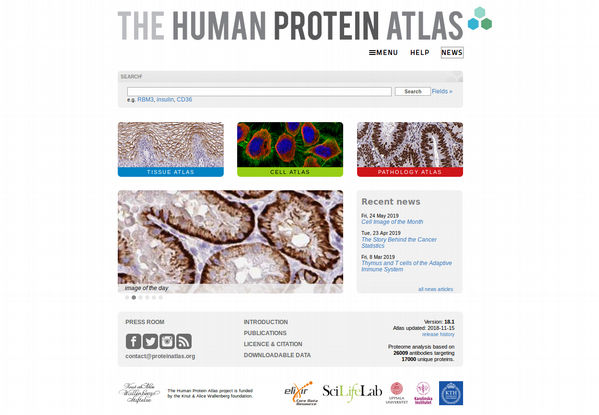

In [3]:
from IPython.display import Image
Image('/home/nikolay/WABI/Misc/HPA/Presentation/HPA.png', width=2000)

The images of HPA demonstrate protein organelle localization labels for each sample. There are in total 28 different labels present in the dataset. The dataset is acquired in a highly standardized way using one imaging modality (confocal microscopy). However, the dataset comprises 27 different cell types of highly different morphology, which affect the protein patterns of the different organelles. All image samples are represented by four filters (stored as individual files): 

* the protein of interest (**green**) plus three cellular landmarks: 
* nucleus (**blue**), 
* microtubules (**red**), 
* endoplasmic reticulum (**yellow**). 

The green filter should hence be used to predict the label, and the other filters are used as references.

### What are the Classes in HPA Images?  <a class="anchor" id="What-are-the-Classes-in-HPA-Images?"></a>

Now we will download and display a few images from HPA. The data are publicly available and can be downloaded from [here](https://www.kaggle.com/c/human-protein-atlas-image-classification/data) provided you have a Kaggle account. The data comes with annotations of 28 different classes, let us have a look at the annotation file:

In [98]:
import pandas as pd
annot = pd.read_csv('/home/nikolay/WABI/Misc/HPA/train.csv')
annot.head()

,Id,Target
0,00070df0-bbc3-11e8-b2bc-ac1f6b6435d0,16 0
1,000a6c98-bb9b-11e8-b2b9-ac1f6b6435d0,7 1 2 0
2,000a9596-bbc4-11e8-b2bc-ac1f6b6435d0,5
3,000c99ba-bba4-11e8-b2b9-ac1f6b6435d0,1
4,001838f8-bbca-11e8-b2bc-ac1f6b6435d0,18


Here we see that the "Target" column has number-coded labels separated by space, let us check what exactly those codes mean, for this purpose we display a dictionary which interprets the labels:

In [2]:
name_label_dict = {
0:  'Nucleoplasm',
1:  'Nuclear membrane',
2:  'Nucleoli',   
3:  'Nucleoli fibrillar center',
4:  'Nuclear speckles',
5:  'Nuclear bodies',
6:  'Endoplasmic reticulum',   
7:  'Golgi apparatus',
8:  'Peroxisomes',
9:  'Endosomes',
10:  'Lysosomes',
11:  'Intermediate filaments',
12:  'Actin filaments',
13:  'Focal adhesion sites',   
14:  'Microtubules',
15:  'Microtubule ends',  
16:  'Cytokinetic bridge',   
17:  'Mitotic spindle',
18:  'Microtubule organizing center',  
19:  'Centrosome',
20:  'Lipid droplets',
21:  'Plasma membrane',   
22:  'Cell junctions', 
23:  'Mitochondria',
24:  'Aggresome',
25:  'Cytosol',
26:  'Cytoplasmic bodies',   
27:  'Rods & rings' }

Let us check the abundance of the 28 classes, for this purpose we plot the histogram of the classes:

In [99]:
import numpy as np
my_classes = [i.split(' ') for i in annot['Target'].values]
my_classes = [int(y) for x in my_classes for y in x]
my_classes[0:10]

[16, 0, 7, 1, 2, 0, 5, 1, 18, 0]

In [100]:
len(my_classes)

50782

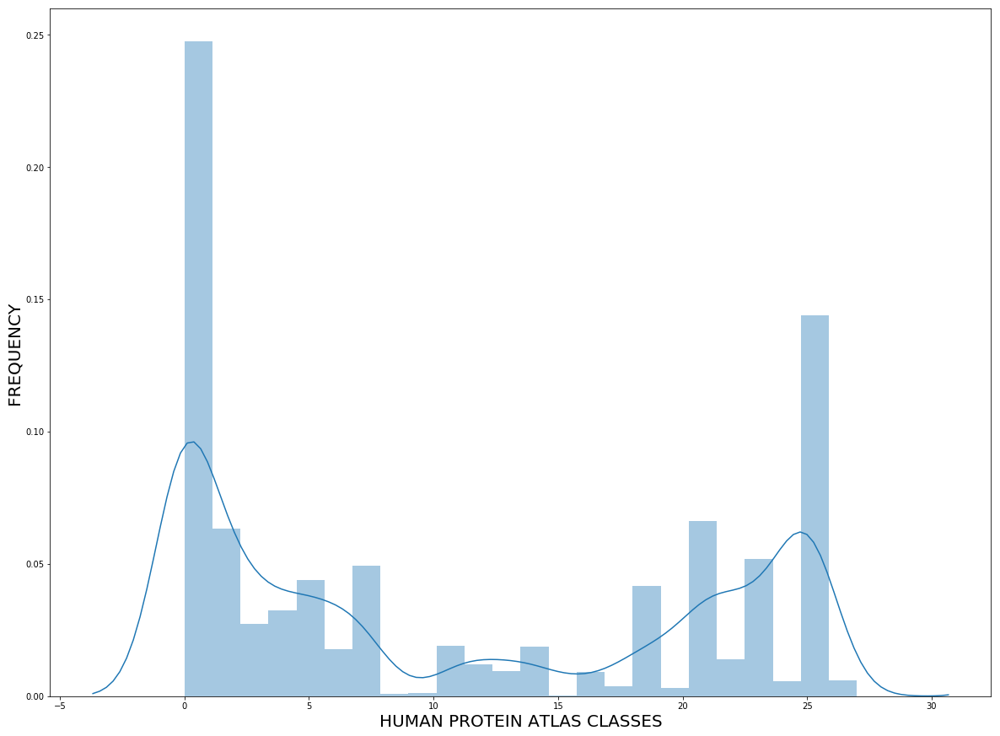

In [103]:
import seaborn as sns
plt.figure(figsize=(20,15))
sns.distplot(my_classes)
plt.xlabel('HUMAN PROTEIN ATLAS CLASSES', fontsize = 20)
plt.ylabel('FREQUENCY', fontsize = 20)
plt.show()

We can see that Nucleoplasm (0) and Cytosol (25) are the most abundaned classes. Let us check how many images have unique labels corresponding to either of those two classes:

In [53]:
import numpy as np
target_array = np.array(annot['Target'].values)
print(target_array[target_array=='0'].shape)
print(target_array[target_array=='25'].shape)

(2414,)
(1470,)


and how many images contain both of those two classes:

In [83]:
sum('0' in i and '25' in i for i in target_array)

3637

In [123]:
annot[annot['Target']=='0'].to_csv('/home/nikolay/WABI/Misc/HPA/Nucleoplasm_images.txt', 
                                   index=False, sep='\t')

In [124]:
annot[annot['Target']=='25'].to_csv('/home/nikolay/WABI/Misc/HPA/Cytosol_images.txt', 
                                    index=False, sep='\t')

In [125]:
annot[annot['Target'].str.contains('0') & 
      annot['Target'].str.contains('25')].to_csv('/home/nikolay/WABI/Misc/HPA/Nucleoplasm_Cytosol_images.txt', 
                                                 index=False, sep='\t')

We conclude that we have ~2500 images where protein is expressed only in Nucleoplasm, ~1500 images where protein is expressed only in Cytosol, and ~3500 images where protein is expressed in both Nucleoplasm and Cytosol. Later we will use first two sets of images in order to train an object detector Faster RCNN neural network to localize and classify cells containing the proteins expressed in Nucleoplasm and Cytosol. The third set of images where both classes (Nucleoplasm and Cytosol) are present will be used for validation, i.e. making object localization with classification. Let us also prepare a list of keys of the dictionary, which we will use later:

In [15]:
label_keys = list()
for keys, values in name_label_dict.items():
    label_keys.append(keys)
print(label_keys)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27]


Therefore the codes are locations inside a cell wher the protein is expressed. 

### How do HPA images look like?  <a class="anchor" id="How-do-HPA-images-look-like?"></a>

Now it is time to open a few images and see how they look like. Here we have a problem. HPA provides 4 channels (Red, Green, Bluw and Yellow) while merging channels in Python can only work in RGB or RGBA modes, where for the latter A stands for a sort of transparency channel which has nothing to do with the yellow one we have here. Of course, image recognition will work with whatever numbers and meanings the channels have, for training a CNN this is not a problem. However, if we want to visualize the images we have to figure out what to do with the 4th channel. One way here would be to realize that yellow = red + green, so we can just add half of the yellow channel values to red and green channels.

In [37]:
from PIL import Image
def load_image(path, id):
    R = np.array(Image.open(path + id + '_red.png'))
    G = np.array(Image.open(path + id + '_green.png'))
    B = np.array(Image.open(path + id + '_blue.png'))
    Y = np.array(Image.open(path + id + '_yellow.png'))
    
    image = np.stack((R + Y/2, G + Y/2, B),-1).astype(np.float32)/255
    return image 

In [41]:
my_image = load_image('/home/nikolay/WABI/Misc/HPA/test/','0a1fe790-bac8-11e8-b2b7-ac1f6b6435d0')
my_image.shape

(512, 512, 3)

Displaying the shape of the array we can see that it has 3 channels instead of 4. This is not an optimal solution but it is only for visualization purposes. Again, we are going to use all the 4 channels for image recognition problem.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


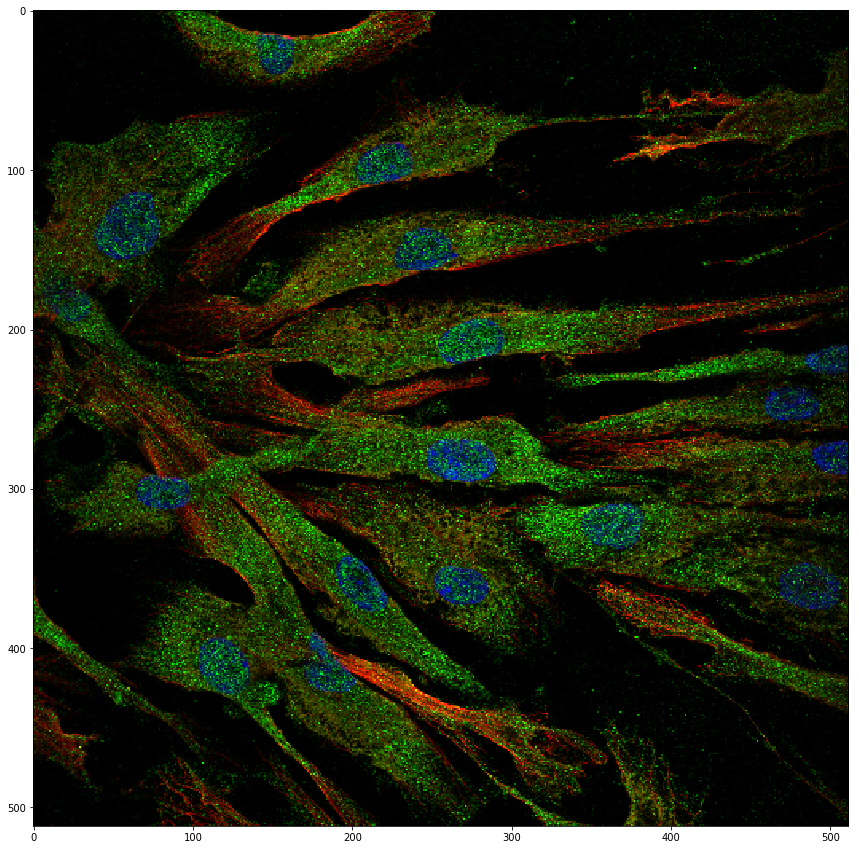

In [40]:
import matplotlib.pyplot as plt
plt.figure(figsize=(20,15))
plt.imshow((my_image*255).astype(np.int))
plt.show()

The warning about clipping the digits simply means that adding Y/2 to red and green channels we exceeded the limit of 255 shades of red and green. Possibly we could have add them like this: Y/2+R/2, Y/2+G/2, in order to avoid the warning. Another approach for visualizing the 4 channel HPA images would be simply ignoring the yellow channel as in theory it should be redundant and the first 3 channels could be enough to catpure all the color range. Let us try to implement it:

In [13]:
import os
import cv2
import numpy as np
def open_rgby(path,id): #a function that reads RGBY image
    colors = ['red','green','blue','yellow']
    flags = cv2.IMREAD_GRAYSCALE
    img = [cv2.imread(os.path.join(path, id + '_' + color + '.png'), flags).astype(np.float32)/255
           for color in colors]
    return np.stack(img, axis=-1)

In [42]:
my_image = open_rgby('/home/nikolay/WABI/Misc/HPA/test/','0a1fe790-bac8-11e8-b2b7-ac1f6b6435d0')
my_image.shape

(512, 512, 4)

Here we have all the 4 channeks included but for visualization we will include only the first 3 i.e. RGB channels:

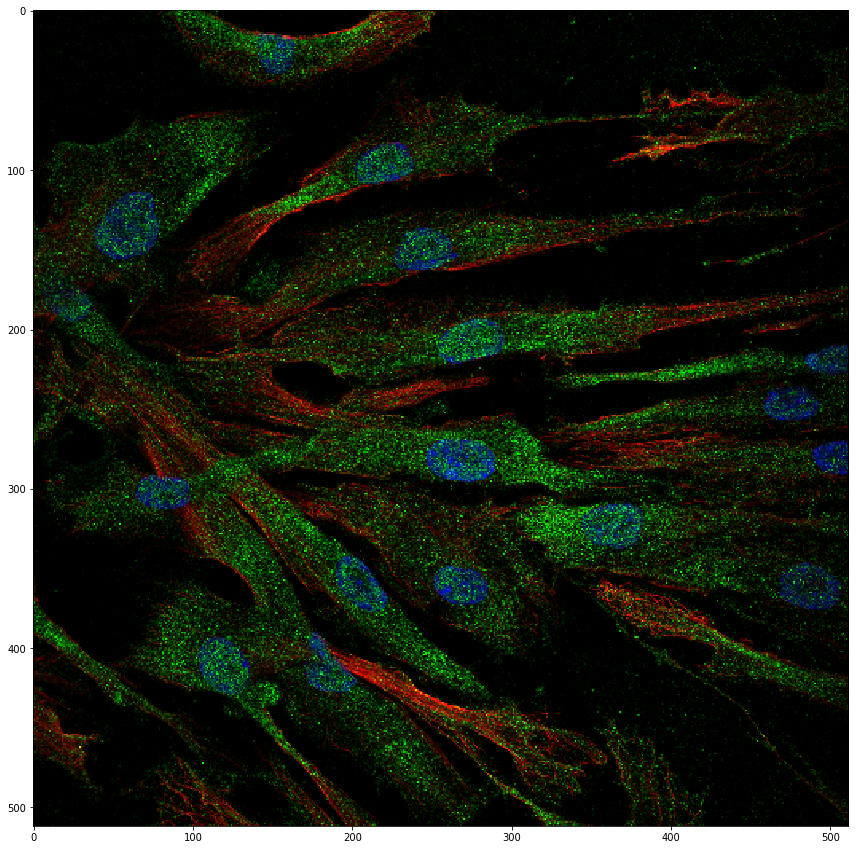

In [23]:
import matplotlib.pyplot as plt
plt.figure(figsize=(20,15))
plt.imshow((my_image[:,:,:3]*255).astype(np.int))
plt.show()

We conclude that, the images look very similar for the two described strategies of image visualization. Either way should work more or less if we want to display the HPA images. Let us re-define the "open_rgby" function where we remove the normalization by 255 as this will be done later when training CNN and augmenting the data with KEras ImageGenerator. We can check that the absense of normalization does not change the way images look like:

In [ ]:
import os
import cv2
import numpy as np
def open_rgby(path,id): #a function that reads RGBY image
    colors = ['red','green','blue','yellow']
    flags = cv2.IMREAD_GRAYSCALE
    #img = [cv2.imread(os.path.join(path, id + '_' + color + '.png'), flags).astype(np.float32)/255 
    #       for color in colors]
    img = [cv2.imread(os.path.join(path, id + '_' + color + '.png'), flags) for color in colors]
    img = np.stack(img, axis=-1)
    img = cv2.resize(img, (512, 512))
    return img

In [2]:
my_image = open_rgby('/home/nikolay/WABI/Misc/HPA/train/','000a6c98-bb9b-11e8-b2b9-ac1f6b6435d0')
my_image.shape

(512, 512, 4)

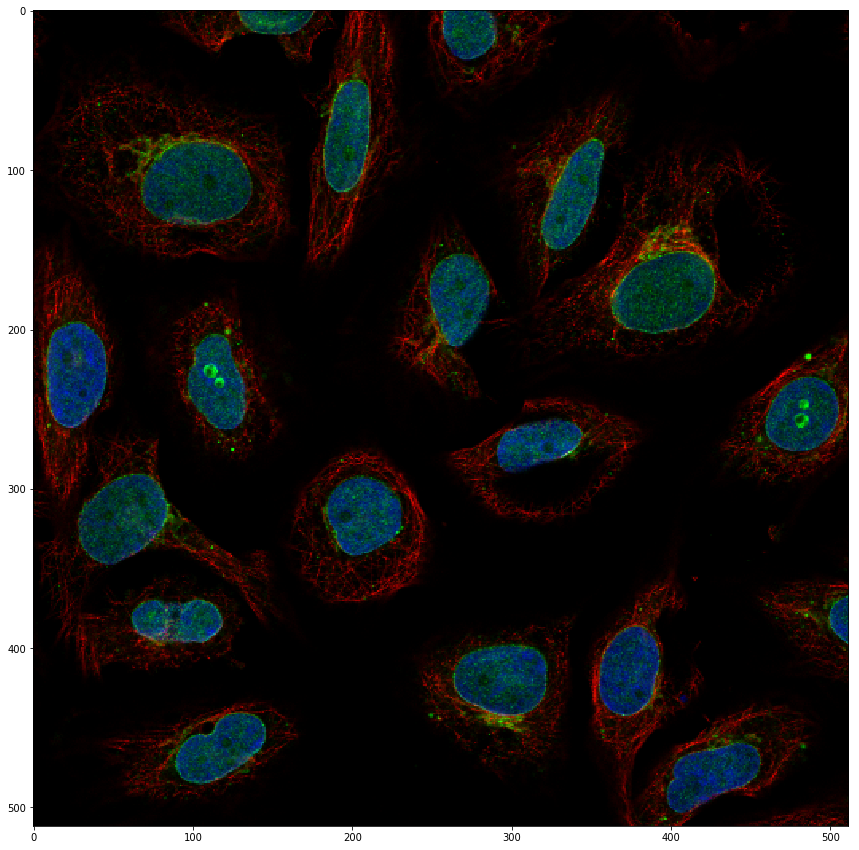

In [7]:
import matplotlib.pyplot as plt
plt.figure(figsize=(20,15))
plt.imshow((my_image[:,:,:3]).astype(np.int))
plt.show()

### Build Automatic Cell Annotation  <a class="anchor" id="Build-Automatic-Cell-Annotation"></a>

We will create a training data set with two types of images: a) images with protein localized in the Nucleoplasm, b) images with protein localized in the Cytosol. There will be also the type of images where the protein is localized sometimes in the Nucleoplasm and sometimes in the Cytosol, or even simultaneously in the Nucleoplasm and Cytosol, we will use these images for validation of the Faster RCNN object detection model. Let us display all three types of images so that the difference is clearly visible:

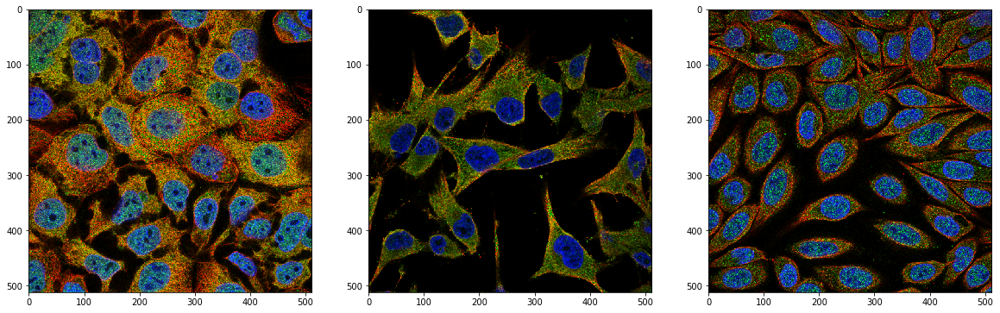

In [214]:
import matplotlib.pyplot as plt
path = '/home/nikolay/WABI/Misc/HPA/Nucleoplasm_Cytosol_Sample_Images'
fig = plt.figure(figsize=(20, 15))

plt.subplot(131)
img = plt.imread(path + '/Nucleoplasm/001bcdd2-bbb2-11e8-b2ba-ac1f6b6435d0.png')
plt.imshow(img)

plt.subplot(132)
img = plt.imread(path + '/Cytosol/00383b44-bbbb-11e8-b2ba-ac1f6b6435d0.png')
plt.imshow(img)

plt.subplot(133)
img = plt.imread(path + '/Nucleoplasm_Plus_Cytosol/0038d6a6-bb9a-11e8-b2b9-ac1f6b6435d0.png')
plt.imshow(img)

plt.show()

It is obvious that on the first image the green color tends to be concentrated in the nuclei, while in the second image it is smeared throughout the cytosol. The third image is somewhere in between, i.e. the green dots are present both in the Nucleoplasm and Cytosol. Now let us move the Nucleoplasm and Cytosol images into same "Nucleoplasm_Cytosol_train" folder.

In [226]:
from shutil import copyfile

Nucleoplasm_ids = annot[annot['Target']=='0'].Id.values
cytosol_ids = annot[annot['Target']=='25'].Id.values

for i in range(len(Nucleoplasm_ids)):
    copyfile('/home/nikolay/WABI/Misc/HPA/train_merged_channels/' + Nucleoplasm_ids[i] + '.png',
            '/home/nikolay/WABI/Misc/HPA/Nucleoplasm_Cytosol_train/' + Nucleoplasm_ids[i] + '.png')
    
for i in range(len(cytosol_ids)):
    copyfile('/home/nikolay/WABI/Misc/HPA/train_merged_channels/' + cytosol_ids[i] + '.png',
            '/home/nikolay/WABI/Misc/HPA/Nucleoplasm_Cytosol_train/' + cytosol_ids[i] + '.png')

Now the training set includes 3884 images which are in the "Nucleoplasm_Cytosol_train" folder. The images belong to two classes: a) Nucleoplasm, and b) Cytosol. However, now we have to annotate the cells putting bounding boxes with labeles on them. This can be done in many ways, for example manually using a very fast and handy **labelImage** tool for Ubuntu, which writes the annotations for each image into an xml file. However, here we will try another (faster) strategy when we use openCV function **findContours** and put bounding boxes and extract their coordinates for thousands of images automatically witout manually opening and looking at them. Let us check how it works for the images containing protein expressed in Nucleoplasms:

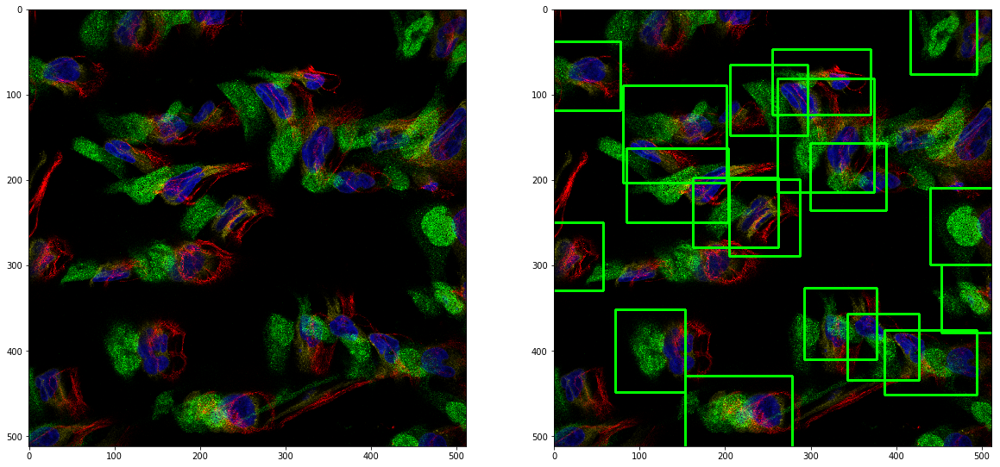

In [262]:
import os
import cv2 
import numpy as np
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings("ignore")

fig = plt.figure(figsize=(20, 15))

img = cv2.imread('/home/nikolay/WABI/Misc/HPA/train_merged_channels/00751f10-bbab-11e8-b2ba-ac1f6b6435d0.png')

img_disp = img[:,:,::-1]
plt.subplot(121)
plt.imshow(img_disp)
    
imCopy = img.copy()
imgray=cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
ret, thresh = cv2.threshold(imgray, 40, 255, 0)
contours, hierarchy =  cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
sorted_ctrs = sorted(contours, key=lambda ctr: cv2.boundingRect(ctr)[0])
#cv2.drawContours(imCopy, contours, -1, (0,255,0))
    
for i, ctr in enumerate(sorted_ctrs):
    x, y, w, h = cv2.boundingRect(ctr)
    roi = img[y:y + h, x:x + w]
    if w > 30 and w < 100 and h > 30 and h < 100:
        cv2.rectangle(imCopy, (x-20, y-20), (x + w + 20, y + h + 20), (0, 255, 0), 2)

plt.subplot(122)
imCopy = imCopy[:,:,::-1]
plt.imshow(imCopy)
plt.show()

And the same for images where protein is expresed in the Cytosol:

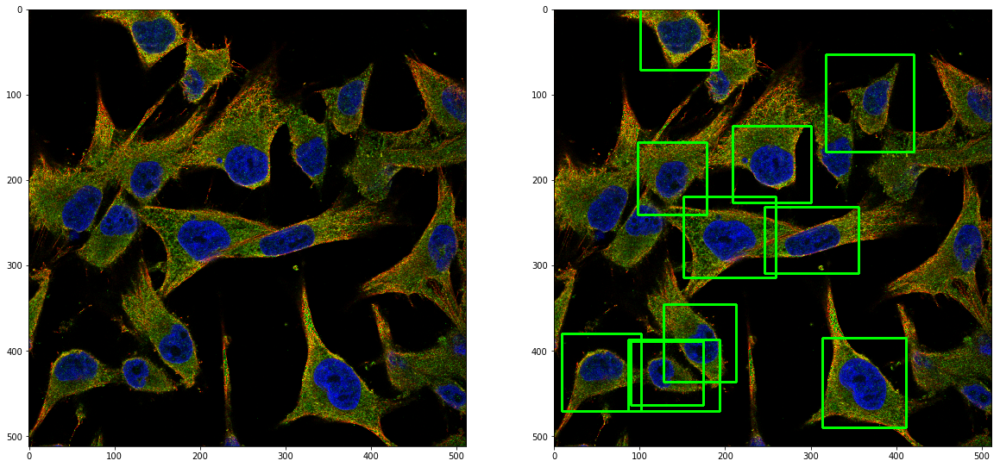

In [261]:
import os
import cv2 
import numpy as np
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings("ignore")

fig = plt.figure(figsize=(20, 15))

img = cv2.imread('/home/nikolay/WABI/Misc/HPA/train_merged_channels/00383b44-bbbb-11e8-b2ba-ac1f6b6435d0.png')

img_disp = img[:,:,::-1]
plt.subplot(121)
plt.imshow(img_disp)
    
imCopy = img.copy()
imgray=cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
ret, thresh = cv2.threshold(imgray, 40, 255, 0)
contours, hierarchy =  cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
sorted_ctrs = sorted(contours, key=lambda ctr: cv2.boundingRect(ctr)[0])
#cv2.drawContours(imCopy, contours, -1, (0,255,0))
    
for i, ctr in enumerate(sorted_ctrs):
    x, y, w, h = cv2.boundingRect(ctr)
    roi = img[y:y + h, x:x + w]
    if w > 30 and w < 100 and h > 30 and h < 100:
        cv2.rectangle(imCopy, (x-20, y-20), (x + w + 20, y + h + 20), (0, 255, 0), 2)

plt.subplot(122)
imCopy = imCopy[:,:,::-1]
plt.imshow(imCopy)
plt.show()

So it works pretty good, maybe the thresholds can be tuned for each image or class (Nucleoplasm vs. Cytosol), but overall it looks ok, so let us try to annotate bounding boxes with openCV and build two image annotation files for each class, we will merge the two annotation files later.

In [227]:
import os
my_images = os.listdir('/home/nikolay/WABI/Misc/HPA/Nucleoplasm_Cytosol_train/')
len(my_images)

3884

In [235]:
import numpy as np
my_classes = [str(np.where(i in annot[annot['Target']=='0'].Id.values + '.png', 'Nucleoplasm', 'Cytosol')) 
              for i in my_images]
my_classes[0:10]

['Nucleoplasm',
 'Nucleoplasm',
 'Nucleoplasm',
 'Nucleoplasm',
 'Nucleoplasm',
 'Nucleoplasm',
 'Cytosol',
 'Cytosol',
 'Cytosol',
 'Nucleoplasm']

In [237]:
import pandas as pd
annot_df = pd.DataFrame({'Image': my_images, 'Class': my_classes})
annot_df.head(10)

,Image,Class
0,b3a934d0-bbc5-11e8-b2bc-ac1f6b6435d0.png,Nucleoplasm
1,2f94918a-bbca-11e8-b2bc-ac1f6b6435d0.png,Nucleoplasm
2,eb8d61ea-bbc1-11e8-b2bb-ac1f6b6435d0.png,Nucleoplasm
3,5922a7f6-bbb3-11e8-b2ba-ac1f6b6435d0.png,Nucleoplasm
4,5e825dce-bbca-11e8-b2bc-ac1f6b6435d0.png,Nucleoplasm
5,3dd19e2c-bbad-11e8-b2ba-ac1f6b6435d0.png,Nucleoplasm
6,9acdb712-bbb9-11e8-b2ba-ac1f6b6435d0.png,Cytosol
7,8e8cb5b8-bbc6-11e8-b2bc-ac1f6b6435d0.png,Cytosol
8,08c3aeec-bbbb-11e8-b2ba-ac1f6b6435d0.png,Cytosol
9,aa60bdf4-bbbf-11e8-b2bb-ac1f6b6435d0.png,Nucleoplasm


Let us define a function that produces an annotation file for one image, then we will use this function in a loop to make an annotation file for all images:

In [266]:
import cv2
import imutils
import numpy as np
import pandas as pd
from PIL import Image
from imutils import contours
from skimage import measure
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings("ignore")

path = '/home/nikolay/WABI/Misc/HPA/Nucleoplasm_Cytosol_train/'
def build_annot(image_file):
    
    img = cv2.imread(path + image_file)

    imCopy = img.copy()
    imgray=cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    ret, thresh = cv2.threshold(imgray, 40, 255, 0)
    contours, hierarchy =  cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    cnts = sorted(contours, key=lambda ctr: cv2.boundingRect(ctr)[0])
    
    x_min = list()
    x_max = list()
    y_min = list()
    y_max = list()
    my_images = list()
    my_classes = list()
    for (i, c) in enumerate(cnts):    
        (x, y, w, h) = cv2.boundingRect(c)
        if w > 30 and w < 100 and h > 30 and h < 100:
            #cv2.rectangle(imCopy, (x-20, y-20), (x + w + 20, y + h + 20), (0, 255, 0), 2)
            if x-20>0:
                x_min.append(x-20)
            else:
                x_min.append(0)
            x_max.append(x + w + 20)
            if y-20>0:
                y_min.append(y-20)
            else:
                y_min.append(0)
            y_max.append(y + h + 20)
            my_images.append('Nucleoplasm_Cytosol_train/' + image_file)
            my_classes.append(str(np.where(image_file in annot[annot['Target']=='0'].Id.values + '.png', 
                                           'Nucleoplasm', 'Cytosol')))
    
    annot_df = pd.DataFrame({'Image': my_images,
                             'xmin': x_min, 'xmax': x_max, 'ymin': y_min, 'ymax': y_max,
                             'Class': my_classes})
    return annot_df

In [267]:
build_annot('00383b44-bbbb-11e8-b2ba-ac1f6b6435d0.png')

,Image,xmin,xmax,ymin,ymax,Class
0,Nucleoplasm_Cytosol_train/00383b44-bbbb-11e8-b2...,9,102,380,471,Cytosol
1,Nucleoplasm_Cytosol_train/00383b44-bbbb-11e8-b2...,87,194,387,471,Cytosol
2,Nucleoplasm_Cytosol_train/00383b44-bbbb-11e8-b2...,90,174,389,464,Cytosol
3,Nucleoplasm_Cytosol_train/00383b44-bbbb-11e8-b2...,98,178,156,241,Cytosol
4,Nucleoplasm_Cytosol_train/00383b44-bbbb-11e8-b2...,101,192,0,72,Cytosol
5,Nucleoplasm_Cytosol_train/00383b44-bbbb-11e8-b2...,128,213,346,436,Cytosol
6,Nucleoplasm_Cytosol_train/00383b44-bbbb-11e8-b2...,151,259,220,314,Cytosol
7,Nucleoplasm_Cytosol_train/00383b44-bbbb-11e8-b2...,209,300,137,227,Cytosol
8,Nucleoplasm_Cytosol_train/00383b44-bbbb-11e8-b2...,246,356,232,309,Cytosol
9,Nucleoplasm_Cytosol_train/00383b44-bbbb-11e8-b2...,313,411,385,490,Cytosol


The coordinates of the windows seem to make sense, so now we will run this function in a loop to build a final annotation file for all images.

In [273]:
import os
annot_df = pd.DataFrame()
j=0
for i in os.listdir('/home/nikolay/WABI/Misc/HPA/Nucleoplasm_Cytosol_train/'):
    annot_df = pd.concat([annot_df, build_annot(str(i))], ignore_index=True)
    j = j + 1
    if j%1000==0:
        print('Finished ' + str(j) + ' images')
annot_df.shape

Finished 1000 images
Finished 2000 images
Finished 3000 images


(39460, 6)

In [276]:
annot_df.head(10)

,Image,xmin,xmax,ymin,ymax,Class
0,Nucleoplasm_Cytosol_train/b3a934d0-bbc5-11e8-b2...,169.0,293.0,436.0,532.0,Nucleoplasm
1,Nucleoplasm_Cytosol_train/2f94918a-bbca-11e8-b2...,0.0,96.0,352.0,435.0,Nucleoplasm
2,Nucleoplasm_Cytosol_train/2f94918a-bbca-11e8-b2...,0.0,65.0,195.0,278.0,Nucleoplasm
3,Nucleoplasm_Cytosol_train/2f94918a-bbca-11e8-b2...,0.0,117.0,235.0,344.0,Nucleoplasm
4,Nucleoplasm_Cytosol_train/2f94918a-bbca-11e8-b2...,6.0,124.0,82.0,191.0,Nucleoplasm
5,Nucleoplasm_Cytosol_train/2f94918a-bbca-11e8-b2...,40.0,139.0,164.0,244.0,Nucleoplasm
6,Nucleoplasm_Cytosol_train/2f94918a-bbca-11e8-b2...,45.0,118.0,41.0,119.0,Nucleoplasm
7,Nucleoplasm_Cytosol_train/2f94918a-bbca-11e8-b2...,46.0,130.0,102.0,180.0,Nucleoplasm
8,Nucleoplasm_Cytosol_train/2f94918a-bbca-11e8-b2...,84.0,189.0,56.0,172.0,Nucleoplasm
9,Nucleoplasm_Cytosol_train/2f94918a-bbca-11e8-b2...,92.0,213.0,0.0,105.0,Nucleoplasm


In [277]:
annot_df.to_csv('/home/nikolay/WABI/Misc/HPA/annot.txt', header=False, index=False, sep=',')

Now we go to the HPA working directory and clone the Faster RCNN repo there:

In [278]:
%%bash
cd /home/nikolay/WABI/Misc/HPA/
git clone https://github.com/kbardool/keras-frcnn.git

Cloning into 'keras-frcnn'...


Now we are moving the annot.txt file as well as the Nucleoplasm_Cytosol_train directory to keras-frcnn:

In [279]:
%%bash
mv /home/nikolay/WABI/Misc/HPA/annot.txt /home/nikolay/WABI/Misc/HPA/keras-frcnn
mv /home/nikolay/WABI/Misc/HPA/Nucleoplasm_Cytosol_train /home/nikolay/WABI/Misc/HPA/keras-frcnn

Now it is time to start training the Faster RCNN model:

In [ ]:
Dell ~/WABI/Misc/HPA/keras-frcnn $ python train_frcnn.py -o simple -p annot.txt --hf --vf --rot --num_epochs 5
Using TensorFlow backend.
Parsing annotation files
Training images per class:
{'Cytosol': 16036, 'Nucleoplasm': 23424, 'bg': 0}
Num classes (including bg) = 3
Config has been written to config.pickle, and can be loaded when testing to ensure correct results
Num train samples 3006
Num val samples 575
loading weights from resnet50_weights_tf_dim_ordering_tf_kernels.h5
Starting training
Epoch 1/5
 932/1000 [==========================>...] - ETA: 31:00 - rpn_cls: 2.6447 - rpn_regr: 0.3144 - detector_cls: 0.8378 - detector_regr: 0.3928Average number of overlapping bounding boxes from RPN = 19.438 for 1000 previous iterations
1000/1000 [==============================] - 26960s 27s/step - rpn_cls: 2.6358 - rpn_regr: 0.3165 - detector_cls: 0.8304 - detector_regr: 0.3924
Mean number of bounding boxes from RPN overlapping ground truth boxes: 19.20891364902507
Classifier accuracy for bounding boxes from RPN: 0.59903125
Loss RPN classifier: 2.6357761421810193
Loss RPN regression: 0.3165443739844486
Loss Detector classifier: 0.8304251846522093
Loss Detector regression: 0.39236855202913284
Elapsed time: 26959.669234752655
Total loss decreased from inf to 4.17511425284681, saving weights
Epoch 2/5
 860/1000 [========================>.....] - ETA: 55:40 - rpn_cls: 2.3321 - rpn_regr: 0.3194 - detector_cls: 0.7495 - detector_regr: 0.3791Average number of overlapping bounding boxes from RPN = 18.012 for 1000 previous iterations
1000/1000 [==============================] - 23598s 24s/step - rpn_cls: 2.3184 - rpn_regr: 0.3122 - detector_cls: 0.7532 - detector_regr: 0.3789
Mean number of bounding boxes from RPN overlapping ground truth boxes: 18.461610486891384
Classifier accuracy for bounding boxes from RPN: 0.61659375
Loss RPN classifier: 2.3183728053818595
Loss RPN regression: 0.3122156623713672
Loss Detector classifier: 0.7531886807456613
Loss Detector regression: 0.37885962024331094
Elapsed time: 23601.038128852844
Total loss decreased from 4.17511425284681 to 3.762636768742199, saving weights
Epoch 3/5
 792/1000 [======================>.......] - ETA: 1:46:32 - rpn_cls: 2.3309 - rpn_regr: 0.2805 - detector_cls: 0.7194 - detector_regr: 0.3662Average number of overlapping bounding boxes from RPN = 18.565 for 1000 previous iterations
1000/1000 [==============================] - 33233s 33s/step - rpn_cls: 2.3124 - rpn_regr: 0.2873 - detector_cls: 0.7178 - detector_regr: 0.3670
Mean number of bounding boxes from RPN overlapping ground truth boxes: 18.183255813953487
Classifier accuracy for bounding boxes from RPN: 0.64021875
Loss RPN classifier: 2.3123828817006595
Loss RPN regression: 0.2873314237166196
Loss Detector classifier: 0.7178175939396024
Loss Detector regression: 0.3670410891622305
Elapsed time: 33235.04756784439
Total loss decreased from 3.762636768742199 to 3.684572988519112, saving weights
Epoch 4/5
 729/1000 [====================>.........] - ETA: 2:56:32 - rpn_cls: 2.2734 - rpn_regr: 0.3065 - detector_cls: 0.7062 - detector_regr: 0.3609Average number of overlapping bounding boxes from RPN = 17.947 for 1000 previous iterations
1000/1000 [==============================] - 34627s 35s/step - rpn_cls: 2.2413 - rpn_regr: 0.2977 - detector_cls: 0.7074 - detector_regr: 0.3610
Mean number of bounding boxes from RPN overlapping ground truth boxes: 17.94408201304753
Classifier accuracy for bounding boxes from RPN: 0.64165625
Loss RPN classifier: 2.241279321528564
Loss RPN regression: 0.2977344523910433
Loss Detector classifier: 0.7074399769306183
Loss Detector regression: 0.36103747713565826
Elapsed time: 34627.68554377556
Total loss decreased from 3.684572988519112 to 3.6074912279858835, saving weights
Epoch 5/5
 660/1000 [==================>...........] - ETA: 2:06:15 - rpn_cls: 2.2264 - rpn_regr: 0.2855 - detector_cls: 0.6935 - detector_regr: 0.3555Average number of overlapping bounding boxes from RPN = 17.419 for 1000 previous iterations
1000/1000 [==============================] - 22334s 22s/step - rpn_cls: 2.1793 - rpn_regr: 0.2825 - detector_cls: 0.6993 - detector_regr: 0.3544
Mean number of bounding boxes from RPN overlapping ground truth boxes: 17.22689075630252
Classifier accuracy for bounding boxes from RPN: 0.654375
Loss RPN classifier: 2.179281935323298
Loss RPN regression: 0.2825001890351996
Loss Detector classifier: 0.6992726347073913
Loss Detector regression: 0.3544095575809479
Elapsed time: 22334.43653845787
Total loss decreased from 3.6074912279858835 to 3.515464316646837, saving weights
Training complete, exiting.

Now let us create the test data set with both Nucleoplasm and Cytosol containing images:

In [286]:
from shutil import copyfile

nucleosome_plus_cytosol_ids = annot[annot['Target'].str.contains('0') & 
                                    annot['Target'].str.contains('25')].Id.values

#annot[annot['Target'].str.contains('0') & annot['Target'].str.contains('25')]

for i in range(len(nucleosome_plus_cytosol_ids)):
    copyfile('/home/nikolay/WABI/Misc/HPA/train_merged_channels/' + nucleosome_plus_cytosol_ids[i] + '.png',
            '/home/nikolay/WABI/Misc/HPA/keras-frcnn/Nucleoplasm_Cytosol_test/' + 
             nucleosome_plus_cytosol_ids[i] + '.png')

To make predictions on the test data set we simply use the weights from the trained Faster RCNN model:

In [ ]:
%%bash
python test_frcnn.py -p Nucleoplasm_Cytosol_test

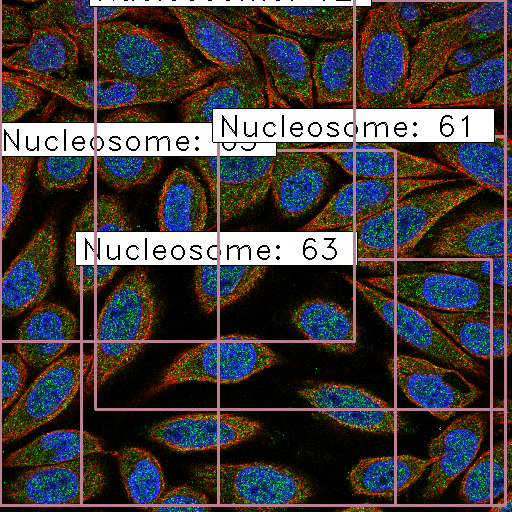

In [287]:
from IPython.display import Image
Image('/home/nikolay/WABI/Misc/HPA/keras-frcnn/Split_Nucleoplasm_Cytosol_Images/results_imgs/0.png',width=2000)

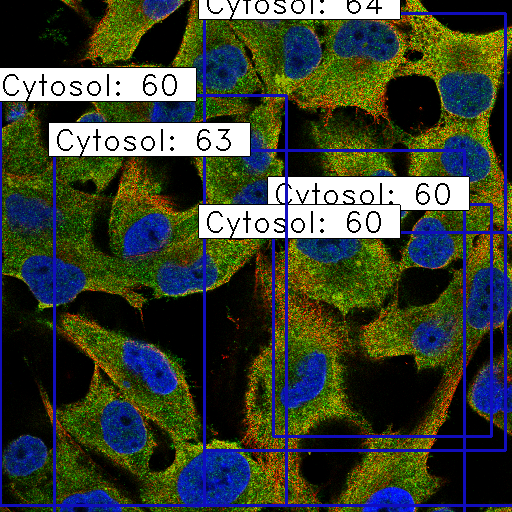

In [288]:
from IPython.display import Image
Image('/home/nikolay/WABI/Misc/HPA/keras-frcnn/Split_Nucleoplasm_Cytosol_Images/results_imgs/1.png',width=2000)

The conclusion we draw from these predictions is that the model can detect only one class per image which is a darwback of building the training data sets as a only one-class-per-image data set. In case two classes are present on an image, the models still detects only one class. So probably not a good idea to train a model on one-class-per-image data set, which is basically equaivalent to image classification rather than object detection problem. In order to annotate images with two classes (Nucleoplasm vs. Cytosol) we need to do it manually using [LabelImg](https://github.com/tzutalin/labelImg) tool.

### Build Manual Cell Annotation  <a class="anchor" id="Build-Manual-Cell-Annotation"></a>

The reason why the previous approach for detecting cells expressing proteins in Nucleoplasm or Cytosol was reduced to simple image classification rather than object detection problem was that images contained only one class (either Nucleoplasm or Cytosol) per image so not so many images had both classes present on the same image. So we need to build a training set with images contaning at least two classes. After lots of digging into Human Protein Atlas documentation and looking at images **I noticed that there were plenty of images with some cells expressing proteins in Nucleoli related regions (Nucleoli, Nucleoli fibrillar center, Nuclear speckles, Nuclear bodies) and some cells without expression in Nucleoli**. Therefore, now I will try to manually select those images (with two classes present) and then go through them with LabelImg tool for annotation of the objects on the images.

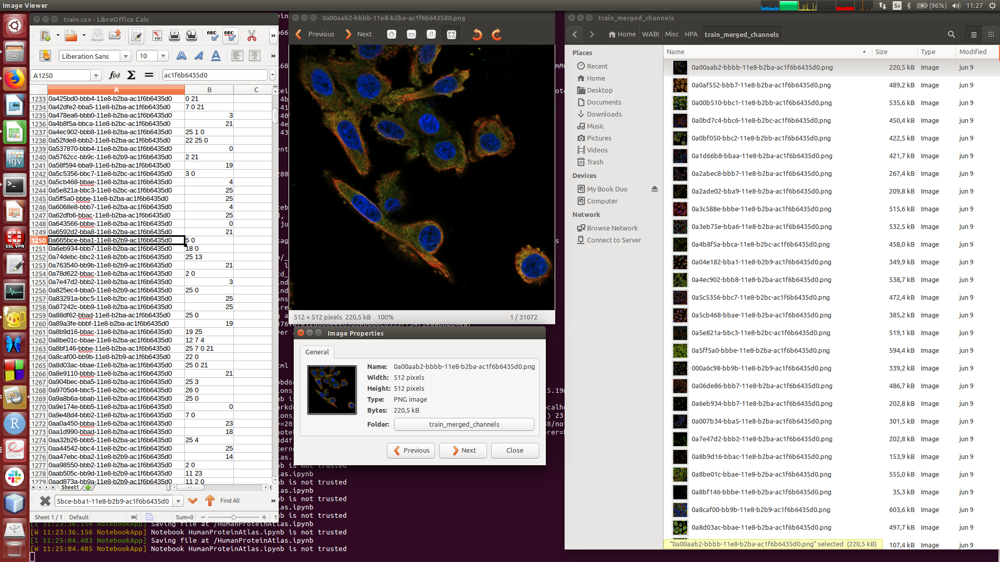

In [1]:
from IPython.display import Image
Image('/home/nikolay/WABI/Misc/HPA/Presentation/SelectingImages.png', width=2000)

I built a list of image IDs with both classes (cells with protein expressed in Nucleoli and not expressed there) present, let us use this list to copy the corresponding images to train and test folders for training the Faster RCNN neural network.

In [12]:
import pandas as pd
image_ids = pd.read_csv('/home/nikolay/WABI/Misc/HPA/Nucleoli_images.txt', header=None)[0].values
image_ids[0:10]

array(['0a0af552-bbb7-11e8-b2ba-ac1f6b6435d0',
       '000a6c98-bb9b-11e8-b2b9-ac1f6b6435d0',
       '0a424aec-bb9f-11e8-b2b9-ac1f6b6435d0',
       '0a665bce-bba1-11e8-b2b9-ac1f6b6435d0',
       '0a904bec-bba5-11e8-b2ba-ac1f6b6435d0',
       '0a3028e6-bbca-11e8-b2bc-ac1f6b6435d0',
       '0a5762cc-bb9c-11e8-b2b9-ac1f6b6435d0',
       '000a9596-bbc4-11e8-b2bc-ac1f6b6435d0',
       '0ac10984-bbba-11e8-b2ba-ac1f6b6435d0',
       '0ad27ddc-bbbe-11e8-b2ba-ac1f6b6435d0'], dtype=object)

In [14]:
from shutil import copyfile
for i in range(len(image_ids)):
    copyfile('/home/nikolay/WABI/Misc/HPA/train_merged_channels/' + image_ids[i] + '.png',
            '/home/nikolay/WABI/Misc/HPA/train/' + image_ids[i] + '.png')

Now I will use LabelImg tool for manual annotation of the images, this will result in an xml-file which will needed to be parsed in order to prepare a special format annotation file for the Faster RCNN neural network as currently the Faster RCNN can not accept an xml-file as annotation.

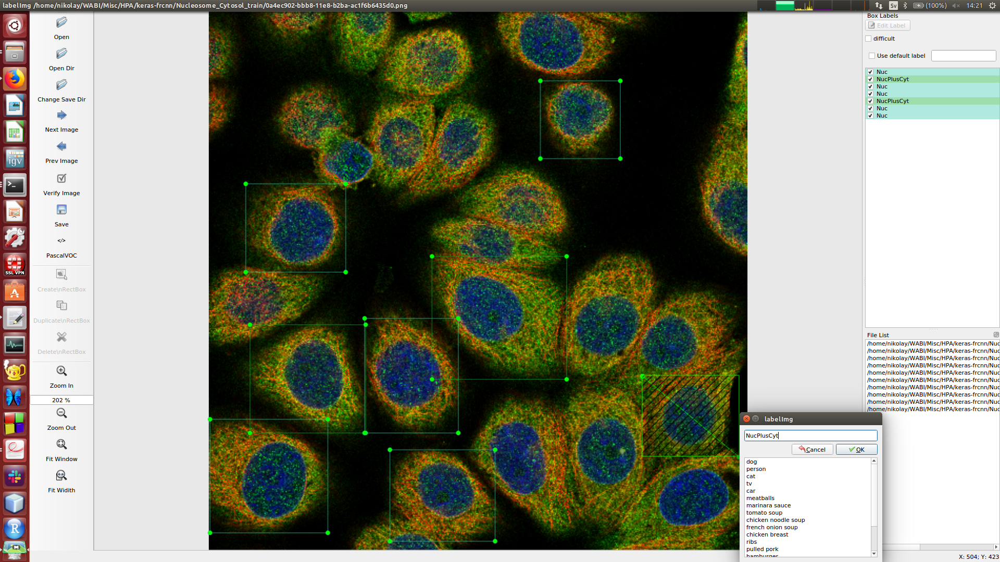

In [15]:
from IPython.display import Image
Image('/home/nikolay/WABI/Misc/HPA/Presentation/LabelImg.png', width=2000)

Now we have created one xml annotation file per image. One xml-file contains coordiantes of the annotating bounding boxes as well as the class assignment for each bounding box. A typical xml-file looks like this:

In [18]:
%%bash
head -25 /home/nikolay/WABI/Misc/HPA/train_annot/0a3028e6-bbca-11e8-b2bc-ac1f6b6435d0.xml

<annotation>
	<folder>train</folder>
	<filename>0a3028e6-bbca-11e8-b2bc-ac1f6b6435d0.png</filename>
	<path>/home/nikolay/WABI/Misc/HPA/train/0a3028e6-bbca-11e8-b2bc-ac1f6b6435d0.png</path>
	<source>
		<database>Unknown</database>
	</source>
	<size>
		<width>512</width>
		<height>512</height>
		<depth>3</depth>
	</size>
	<segmented>0</segmented>
	<object>
		<name>Nucleoli</name>
		<pose>Unspecified</pose>
		<truncated>0</truncated>
		<difficult>0</difficult>
		<bndbox>
			<xmin>317</xmin>
			<ymin>410</ymin>
			<xmax>411</xmax>
			<ymax>507</ymax>
		</bndbox>
	</object>


Now we are going to parse each xml-file using Python module ElementTree and merge the annotations in a single file which will be fed into the Faster RCNN neural network;

In [109]:
def build_annot(file):
    from xml.etree import ElementTree
    # load and parse the file
    tree = ElementTree.parse(file)
    # get the root of the document
    root = tree.getroot()

    # extract each bounding box
    x_min = list()
    x_max = list()
    y_min = list()
    y_max = list()
    for box in root.findall('.//bndbox'):
        x_min.append(int(box.find('xmin').text))
        y_min.append(int(box.find('ymin').text))
        x_max.append(int(box.find('xmax').text))
        y_max.append(int(box.find('ymax').text))
    
    my_classes = list()    
    my_images = list()
    for name in root.findall('.//object'):
        my_classes.append(name.find('name').text)
        my_images.append('train/' + root.findall('.//filename')[0].text)

    annot_df = pd.DataFrame({'Image': my_images,'xmin': x_min, 'xmax': x_max, 'ymin': y_min, 'ymax': y_max, 
                         'Class': my_classes})
    return annot_df

In [110]:
build_annot('/home/nikolay/WABI/Misc/HPA/train_annot/0a3028e6-bbca-11e8-b2bc-ac1f6b6435d0.xml')

,Image,xmin,xmax,ymin,ymax,Class
0,train/0a3028e6-bbca-11e8-b2bc-ac1f6b6435d0.png,317,411,410,507,Nucleoli
1,train/0a3028e6-bbca-11e8-b2bc-ac1f6b6435d0.png,230,400,311,389,Not Nucleoli
2,train/0a3028e6-bbca-11e8-b2bc-ac1f6b6435d0.png,92,204,473,512,Nucleoli
3,train/0a3028e6-bbca-11e8-b2bc-ac1f6b6435d0.png,246,377,163,300,Not Nucleoli
4,train/0a3028e6-bbca-11e8-b2bc-ac1f6b6435d0.png,55,158,81,186,Not Nucleoli
5,train/0a3028e6-bbca-11e8-b2bc-ac1f6b6435d0.png,380,491,36,163,Nucleoli
6,train/0a3028e6-bbca-11e8-b2bc-ac1f6b6435d0.png,147,239,157,272,Not Nucleoli
7,train/0a3028e6-bbca-11e8-b2bc-ac1f6b6435d0.png,68,178,303,412,Not Nucleoli
8,train/0a3028e6-bbca-11e8-b2bc-ac1f6b6435d0.png,452,512,324,420,Not Nucleoli
9,train/0a3028e6-bbca-11e8-b2bc-ac1f6b6435d0.png,222,334,1,72,Not Nucleoli


In [114]:
import os
annot_df = pd.DataFrame()
j=0
for i in os.listdir('/home/nikolay/WABI/Misc/HPA/train_annot/'):
    annot_df = pd.concat([annot_df, build_annot('/home/nikolay/WABI/Misc/HPA/train_annot/' 
                                                + str(i))], ignore_index=True)
    j = j + 1
    if j%10==0:
        print('Finished ' + str(j) + ' images')
annot_df.shape

Finished 10 images
Finished 20 images
Finished 30 images
Finished 40 images


(628, 6)

In [115]:
annot_df.head(20)

,Image,xmin,xmax,ymin,ymax,Class
0,train/0b8b42f0-bbbd-11e8-b2ba-ac1f6b6435d0.png,125,225,252,344,Nucleoli
1,train/0b8b42f0-bbbd-11e8-b2ba-ac1f6b6435d0.png,203,355,38,141,Nucleoli
2,train/0b8b42f0-bbbd-11e8-b2ba-ac1f6b6435d0.png,201,333,162,234,Nucleoli
3,train/0b8b42f0-bbbd-11e8-b2ba-ac1f6b6435d0.png,454,512,128,229,Nucleoli
4,train/0b8b42f0-bbbd-11e8-b2ba-ac1f6b6435d0.png,55,137,170,268,Not Nucleoli
5,train/0b8b42f0-bbbd-11e8-b2ba-ac1f6b6435d0.png,118,214,393,460,Not Nucleoli
6,train/0b8b42f0-bbbd-11e8-b2ba-ac1f6b6435d0.png,200,286,345,401,Not Nucleoli
7,train/0b8b42f0-bbbd-11e8-b2ba-ac1f6b6435d0.png,289,370,280,351,Not Nucleoli
8,train/0b8b42f0-bbbd-11e8-b2ba-ac1f6b6435d0.png,255,338,324,387,Not Nucleoli
9,train/0b8b42f0-bbbd-11e8-b2ba-ac1f6b6435d0.png,361,432,53,145,Not Nucleoli


In [116]:
annot_df.to_csv('/home/nikolay/WABI/Misc/HPA/annot.txt', header=False, index=False, sep=',')

In [ ]:
Dell ~/WABI/Misc/HPA/keras-frcnn $ python train_frcnn.py -o simple -p annot.txt --hf --vf --rot --num_epochs 10000
Using TensorFlow backend.
Parsing annotation files
Training images per class:
{'Not Nucleoli': 306, 'Nucleoli': 322, 'bg': 0}
Num classes (including bg) = 3
Config has been written to config.pickle, and can be loaded when testing to ensure correct results
Num train samples 39
Num val samples 6
loading weights from resnet50_weights_tf_dim_ordering_tf_kernels.h5
Starting training
Epoch 1/10000
1000/1000 [==============================] - 22430s 22s/step - rpn_cls: 2.0509 - rpn_regr: 0.2752 - detector_cls: 0.8778 - detector_regr: 0.3876
Mean number of bounding boxes from RPN overlapping ground truth boxes: 30.053
Classifier accuracy for bounding boxes from RPN: 0.57925
Loss RPN classifier: 2.05094495473383
Loss RPN regression: 0.27519520911201834
Loss Detector classifier: 0.8778360531628132
Loss Detector regression: 0.3875893936008215
Elapsed time: 22430.109295129776
Total loss decreased from inf to 3.591565610609483, saving weights
Epoch 2/10000
Average number of overlapping bounding boxes from RPN = 30.053 for 1000 previous iterations
1000/1000 [==============================] - 21163s 21s/step - rpn_cls: 1.5567 - rpn_regr: 0.2540 - detector_cls: 0.6295 - detector_regr: 0.3403
Mean number of bounding boxes from RPN overlapping ground truth boxes: 31.361
Classifier accuracy for bounding boxes from RPN: 0.7128125
Loss RPN classifier: 1.556680513400268
Loss RPN regression: 0.2540473376754671
Loss Detector classifier: 0.6295278542637825
Loss Detector regression: 0.3402738288938999
Elapsed time: 21166.671939611435
Total loss decreased from 3.591565610609483 to 2.7805295342334175, saving weights
Epoch 3/10000
Average number of overlapping bounding boxes from RPN = 31.361 for 1000 previous iterations
1000/1000 [==============================] - 21130s 21s/step - rpn_cls: 1.3540 - rpn_regr: 0.2331 - detector_cls: 0.4957 - detector_regr: 0.3149
Mean number of bounding boxes from RPN overlapping ground truth boxes: 32.021
Classifier accuracy for bounding boxes from RPN: 0.78490625
Loss RPN classifier: 1.3539557605913142
Loss RPN regression: 0.233059987206012
Loss Detector classifier: 0.49571804262697694
Loss Detector regression: 0.3149350073188543
Elapsed time: 21130.437718153
Total loss decreased from 2.7805295342334175 to 2.397668797743157, saving weights
Epoch 4/10000
Average number of overlapping bounding boxes from RPN = 32.021 for 1000 previous iterations
1000/1000 [==============================] - 21418s 21s/step - rpn_cls: 1.2342 - rpn_regr: 0.2066 - detector_cls: 0.4253 - detector_regr: 0.2840
Mean number of bounding boxes from RPN overlapping ground truth boxes: 32.496
Classifier accuracy for bounding boxes from RPN: 0.82046875
Loss RPN classifier: 1.2341662152552717
Loss RPN regression: 0.20663386416807772
Loss Detector classifier: 0.42533366396278144
Loss Detector regression: 0.28403743417561056
Elapsed time: 21418.011533260345
Total loss decreased from 2.397668797743157 to 2.1501711775617416, saving weights
Epoch 5/10000
Average number of overlapping bounding boxes from RPN = 32.496 for 1000 previous iterations
1000/1000 [==============================] - 21357s 21s/step - rpn_cls: 1.1614 - rpn_regr: 0.1870 - detector_cls: 0.3907 - detector_regr: 0.2565
Mean number of bounding boxes from RPN overlapping ground truth boxes: 33.182
Classifier accuracy for bounding boxes from RPN: 0.83684375
Loss RPN classifier: 1.1613867851189925
Loss RPN regression: 0.18703547438420356
Loss Detector classifier: 0.39065073551237584
Loss Detector regression: 0.2564831233024597
Elapsed time: 21357.343373537064
Total loss decreased from 2.1501711775617416 to 1.9955561183180315, saving weights
Epoch 6/10000
Average number of overlapping bounding boxes from RPN = 33.182 for 1000 previous iterations
1000/1000 [==============================] - 21148s 21s/step - rpn_cls: 1.0488 - rpn_regr: 0.1719 - detector_cls: 0.3496 - detector_regr: 0.2311
Mean number of bounding boxes from RPN overlapping ground truth boxes: 33.908
Classifier accuracy for bounding boxes from RPN: 0.85496875
Loss RPN classifier: 1.0487537255137085
Loss RPN regression: 0.1718946866458282
Loss Detector classifier: 0.3496353446915746
Loss Detector regression: 0.23107719577103852
Elapsed time: 21148.461688041687
Total loss decreased from 1.9955561183180315 to 1.8013609526221497, saving weights
Epoch 7/10000
Average number of overlapping bounding boxes from RPN = 33.908 for 1000 previous iterations
1000/1000 [==============================] - 21118s 21s/step - rpn_cls: 0.9100 - rpn_regr: 0.1587 - detector_cls: 0.3384 - detector_regr: 0.2127
Mean number of bounding boxes from RPN overlapping ground truth boxes: 34.547
Classifier accuracy for bounding boxes from RPN: 0.85890625
Loss RPN classifier: 0.9099948017458828
Loss RPN regression: 0.15865141694899648
Loss Detector classifier: 0.33840095838159323
Loss Detector regression: 0.21269864028692245
Elapsed time: 21118.17912220955
Total loss decreased from 1.8013609526221497 to 1.619745817363395, saving weights
Epoch 8/10000
Average number of overlapping bounding boxes from RPN = 34.547 for 1000 previous iterations
1000/1000 [==============================] - 21625s 22s/step - rpn_cls: 0.7831 - rpn_regr: 0.1474 - detector_cls: 0.3169 - detector_regr: 0.1924
Mean number of bounding boxes from RPN overlapping ground truth boxes: 34.81
Classifier accuracy for bounding boxes from RPN: 0.86884375
Loss RPN classifier: 0.7830751376764119
Loss RPN regression: 0.1474300405085087
Loss Detector classifier: 0.3169439821317792
Loss Detector regression: 0.19236535024642945
Elapsed time: 21625.02184486389
Total loss decreased from 1.619745817363395 to 1.4398145105631295, saving weights
Epoch 9/10000
Average number of overlapping bounding boxes from RPN = 34.81 for 1000 previous iterations
1000/1000 [==============================] - 22073s 22s/step - rpn_cls: 0.7160 - rpn_regr: 0.1366 - detector_cls: 0.2952 - detector_regr: 0.1768
Mean number of bounding boxes from RPN overlapping ground truth boxes: 35.916
Classifier accuracy for bounding boxes from RPN: 0.87915625
Loss RPN classifier: 0.716044131407455
Loss RPN regression: 0.13661550888512283
Loss Detector classifier: 0.2952220716513693
Loss Detector regression: 0.17679114001616836
Elapsed time: 22073.53613257408
Total loss decreased from 1.4398145105631295 to 1.3246728519601156, saving weights
Epoch 10/10000
Average number of overlapping bounding boxes from RPN = 35.916 for 1000 previous iterations
1000/1000 [==============================] - 21314s 21s/step - rpn_cls: 0.6306 - rpn_regr: 0.1271 - detector_cls: 0.2820 - detector_regr: 0.1626
Mean number of bounding boxes from RPN overlapping ground truth boxes: 36.084
Classifier accuracy for bounding boxes from RPN: 0.8825
Loss RPN classifier: 0.6305666697095503
Loss RPN regression: 0.12708920037187635
Loss Detector classifier: 0.28203538976609704
Loss Detector regression: 0.16255826824530958
Elapsed time: 21314.3720972538
Total loss decreased from 1.3246728519601156 to 1.2022495280928331, saving weights
Epoch 11/10000
Average number of overlapping bounding boxes from RPN = 36.084 for 1000 previous iterations
1000/1000 [==============================] - 21325s 21s/step - rpn_cls: 0.6109 - rpn_regr: 0.1185 - detector_cls: 0.2783 - detector_regr: 0.1557
Mean number of bounding boxes from RPN overlapping ground truth boxes: 36.356
Classifier accuracy for bounding boxes from RPN: 0.8863125
Loss RPN classifier: 0.610935872397038
Loss RPN regression: 0.11847636890597642
Loss Detector classifier: 0.2782516769580543
Loss Detector regression: 0.15570138258859514
Elapsed time: 21325.846995592117
Total loss decreased from 1.2022495280928331 to 1.1633653008496638, saving weights
Epoch 12/10000
Average number of overlapping bounding boxes from RPN = 36.356 for 1000 previous iterations
1000/1000 [==============================] - 41265s 41s/step - rpn_cls: 0.5534 - rpn_regr: 0.1103 - detector_cls: 0.2656 - detector_regr: 0.1463
Mean number of bounding boxes from RPN overlapping ground truth boxes: 37.015
Classifier accuracy for bounding boxes from RPN: 0.89134375
Loss RPN classifier: 0.5534107934835393
Loss RPN regression: 0.11031862543616444
Loss Detector classifier: 0.26561567696742716
Loss Detector regression: 0.146341767963022
Elapsed time: 41265.40451359749
Total loss decreased from 1.1633653008496638 to 1.0756868638501529, saving weights
Epoch 13/10000
Average number of overlapping bounding boxes from RPN = 37.015 for 1000 previous iterations
1000/1000 [==============================] - 20915s 21s/step - rpn_cls: 0.5431 - rpn_regr: 0.1042 - detector_cls: 0.2578 - detector_regr: 0.1437
Mean number of bounding boxes from RPN overlapping ground truth boxes: 37.584
Classifier accuracy for bounding boxes from RPN: 0.895
Loss RPN classifier: 0.5430730609981551
Loss RPN regression: 0.10422242442052812
Loss Detector classifier: 0.2578288384526968
Loss Detector regression: 0.14369184495508672
Elapsed time: 20915.18258047104
Total loss decreased from 1.0756868638501529 to 1.0488161688264668, saving weights
Epoch 14/10000
Average number of overlapping bounding boxes from RPN = 37.584 for 1000 previous iterations
1000/1000 [==============================] - 20767s 21s/step - rpn_cls: 0.5402 - rpn_regr: 0.0954 - detector_cls: 0.2377 - detector_regr: 0.1284 
Mean number of bounding boxes from RPN overlapping ground truth boxes: 37.211
Classifier accuracy for bounding boxes from RPN: 0.9005
Loss RPN classifier: 0.5402326177748704
Loss RPN regression: 0.09537993429042399
Loss Detector classifier: 0.2377360167838633
Loss Detector regression: 0.12838885222002863
Elapsed time: 20767.24932694435
Total loss decreased from 1.0488161688264668 to 1.0017374210691865, saving weights
Epoch 15/10000
Average number of overlapping bounding boxes from RPN = 37.211 for 1000 previous iterations
1000/1000 [==============================] - 20897s 21s/step - rpn_cls: 0.4946 - rpn_regr: 0.0897 - detector_cls: 0.2453 - detector_regr: 0.1283
Mean number of bounding boxes from RPN overlapping ground truth boxes: 37.805
Classifier accuracy for bounding boxes from RPN: 0.89934375
Loss RPN classifier: 0.49455005864187784
Loss RPN regression: 0.0896786967208609
Loss Detector classifier: 0.24529225523769854
Loss Detector regression: 0.12825991952605545
Elapsed time: 20897.466459274292
Total loss decreased from 1.0017374210691865 to 0.9577809301264928, saving weights
Epoch 16/10000
Average number of overlapping bounding boxes from RPN = 37.805 for 1000 previous iterations
1000/1000 [==============================] - 30073s 30s/step - rpn_cls: 0.4966 - rpn_regr: 0.0831 - detector_cls: 0.2310 - detector_regr: 0.1231
Mean number of bounding boxes from RPN overlapping ground truth boxes: 37.641
Classifier accuracy for bounding boxes from RPN: 0.90696875
Loss RPN classifier: 0.49658581292159465
Loss RPN regression: 0.08305648598121479
Loss Detector classifier: 0.23103291362524034
Loss Detector regression: 0.12312023165076971
Elapsed time: 30072.95324063301
Total loss decreased from 0.9577809301264928 to 0.9337954441788194, saving weights
Epoch 17/10000
Average number of overlapping bounding boxes from RPN = 37.641 for 1000 previous iterations
1000/1000 [==============================] - 21603s 22s/step - rpn_cls: 0.4772 - rpn_regr: 0.0793 - detector_cls: 0.2250 - detector_regr: 0.1176
Mean number of bounding boxes from RPN overlapping ground truth boxes: 37.879
Classifier accuracy for bounding boxes from RPN: 0.90953125
Loss RPN classifier: 0.4771991874499107
Loss RPN regression: 0.0792888268022798
Loss Detector classifier: 0.22499870961904525
Loss Detector regression: 0.11758025328442455
Elapsed time: 21603.97685432434
Total loss decreased from 0.9337954441788194 to 0.8990669771556603, saving weights
Epoch 18/10000
Average number of overlapping bounding boxes from RPN = 37.879 for 1000 previous iterations
1000/1000 [==============================] - 21407s 21s/step - rpn_cls: 0.4585 - rpn_regr: 0.0728 - detector_cls: 0.2156 - detector_regr: 0.1101 
Mean number of bounding boxes from RPN overlapping ground truth boxes: 38.228
Classifier accuracy for bounding boxes from RPN: 0.912875
Loss RPN classifier: 0.45850668918612714
Loss RPN regression: 0.07281306727509945
Loss Detector classifier: 0.2155550824664533
Loss Detector regression: 0.11007109035737812
Elapsed time: 21407.387610197067
Total loss decreased from 0.8990669771556603 to 0.8569459292850581, saving weights
Epoch 19/10000
Average number of overlapping bounding boxes from RPN = 38.228 for 1000 previous iterations
1000/1000 [==============================] - 21608s 22s/step - rpn_cls: 0.4448 - rpn_regr: 0.0693 - detector_cls: 0.2135 - detector_regr: 0.1078
Mean number of bounding boxes from RPN overlapping ground truth boxes: 38.124
Classifier accuracy for bounding boxes from RPN: 0.91334375
Loss RPN classifier: 0.44481093087204066
Loss RPN regression: 0.06934262582240626
Loss Detector classifier: 0.21354878743365407
Loss Detector regression: 0.10784605756774544
Elapsed time: 21608.833575963974
Total loss decreased from 0.8569459292850581 to 0.8355484016958464, saving weights
Epoch 20/10000
Average number of overlapping bounding boxes from RPN = 38.124 for 1000 previous iterations
1000/1000 [==============================] - 21713s 22s/step - rpn_cls: 0.4614 - rpn_regr: 0.0703 - detector_cls: 0.2110 - detector_regr: 0.1058
Mean number of bounding boxes from RPN overlapping ground truth boxes: 38.201
Classifier accuracy for bounding boxes from RPN: 0.9144375
Loss RPN classifier: 0.4613599873723005
Loss RPN regression: 0.07033278480172157
Loss Detector classifier: 0.2109718689955771
Loss Detector regression: 0.10575046196579933
Elapsed time: 21713.681329727173
Epoch 21/10000
Average number of overlapping bounding boxes from RPN = 38.201 for 1000 previous iterations
1000/1000 [==============================] - 21243s 21s/step - rpn_cls: 0.4550 - rpn_regr: 0.0630 - detector_cls: 0.1980 - detector_regr: 0.1008
Mean number of bounding boxes from RPN overlapping ground truth boxes: 38.884
Classifier accuracy for bounding boxes from RPN: 0.91815625
Loss RPN classifier: 0.4550306052297517
Loss RPN regression: 0.06303781606582924
Loss Detector classifier: 0.19796468804962933
Loss Detector regression: 0.10075294262170792
Elapsed time: 21242.826304912567
Total loss decreased from 0.8355484016958464 to 0.8167860519669181, saving weights
Epoch 22/10000
Average number of overlapping bounding boxes from RPN = 38.884 for 1000 previous iterations
1000/1000 [==============================] - 33233s 33s/step - rpn_cls: 0.4519 - rpn_regr: 0.0612 - detector_cls: 0.2025 - detector_regr: 0.1006
Mean number of bounding boxes from RPN overlapping ground truth boxes: 38.595
Classifier accuracy for bounding boxes from RPN: 0.91771875
Loss RPN classifier: 0.4518570513916995
Loss RPN regression: 0.0612476367703639
Loss Detector classifier: 0.20245656198449433
Loss Detector regression: 0.10055739968083799
Elapsed time: 33233.60543727875
Total loss decreased from 0.8167860519669181 to 0.8161186498273958, saving weights
Epoch 23/10000
Average number of overlapping bounding boxes from RPN = 38.595 for 1000 previous iterations
1000/1000 [==============================] - 39967s 40s/step - rpn_cls: 0.4273 - rpn_regr: 0.0577 - detector_cls: 0.2010 - detector_regr: 0.0946 
Mean number of bounding boxes from RPN overlapping ground truth boxes: 39.124
Classifier accuracy for bounding boxes from RPN: 0.91796875
Loss RPN classifier: 0.4272700461599023
Loss RPN regression: 0.05767148887738585
Loss Detector classifier: 0.20099677404761315
Loss Detector regression: 0.09464430233091116
Elapsed time: 39967.43740057945
Total loss decreased from 0.8161186498273958 to 0.7805826114158124, saving weights
Epoch 24/10000
Average number of overlapping bounding boxes from RPN = 39.124 for 1000 previous iterations
1000/1000 [==============================] - 21193s 21s/step - rpn_cls: 0.4216 - rpn_regr: 0.0551 - detector_cls: 0.1993 - detector_regr: 0.0950
Mean number of bounding boxes from RPN overlapping ground truth boxes: 38.711
Classifier accuracy for bounding boxes from RPN: 0.9184375
Loss RPN classifier: 0.42164385410399463
Loss RPN regression: 0.055142211055848746
Loss Detector classifier: 0.1993047524113208
Loss Detector regression: 0.09497702130489051
Elapsed time: 21192.998307466507
Total loss decreased from 0.7805826114158124 to 0.7710678388760547, saving weights
Epoch 25/10000
Average number of overlapping bounding boxes from RPN = 38.711 for 1000 previous iterations
1000/1000 [==============================] - 21344s 21s/step - rpn_cls: 0.4268 - rpn_regr: 0.0535 - detector_cls: 0.1908 - detector_regr: 0.0916
Mean number of bounding boxes from RPN overlapping ground truth boxes: 39.038
Classifier accuracy for bounding boxes from RPN: 0.92259375
Loss RPN classifier: 0.42683176372718434
Loss RPN regression: 0.05349345727660693
Loss Detector classifier: 0.19082738610729574
Loss Detector regression: 0.09160125304758548
Elapsed time: 21345.18763113022
Total loss decreased from 0.7710678388760547 to 0.7627538601586725, saving weights
Epoch 26/10000
Average number of overlapping bounding boxes from RPN = 39.038 for 1000 previous iterations
1000/1000 [==============================] - 21261s 21s/step - rpn_cls: 0.4179 - rpn_regr: 0.0509 - detector_cls: 0.1850 - detector_regr: 0.0900 
Mean number of bounding boxes from RPN overlapping ground truth boxes: 39.244
Classifier accuracy for bounding boxes from RPN: 0.92453125
Loss RPN classifier: 0.4178515907306857
Loss RPN regression: 0.050858578613610005
Loss Detector classifier: 0.18501365538313985
Loss Detector regression: 0.08995872491970658
Elapsed time: 21261.05927681923
Total loss decreased from 0.7627538601586725 to 0.7436825496471421, saving weights
Epoch 27/10000
Average number of overlapping bounding boxes from RPN = 39.244 for 1000 previous iterations
1000/1000 [==============================] - 23065s 23s/step - rpn_cls: 0.4217 - rpn_regr: 0.0457 - detector_cls: 0.1840 - detector_regr: 0.0855 
Mean number of bounding boxes from RPN overlapping ground truth boxes: 39.093
Classifier accuracy for bounding boxes from RPN: 0.92484375
Loss RPN classifier: 0.4216897801466593
Loss RPN regression: 0.04571793054952286
Loss Detector classifier: 0.18403234959952533
Loss Detector regression: 0.0855187908206135
Elapsed time: 23065.333673238754
Total loss decreased from 0.7436825496471421 to 0.736958851116321, saving weights
Epoch 28/10000
Average number of overlapping bounding boxes from RPN = 39.093 for 1000 previous iterations
1000/1000 [==============================] - 21214s 21s/step - rpn_cls: 0.4146 - rpn_regr: 0.0460 - detector_cls: 0.1862 - detector_regr: 0.0876
Mean number of bounding boxes from RPN overlapping ground truth boxes: 40.08
Classifier accuracy for bounding boxes from RPN: 0.9248125
Loss RPN classifier: 0.41460389521977525
Loss RPN regression: 0.04602701734192669
Loss Detector classifier: 0.1861520145405084
Loss Detector regression: 0.0875904792919755
Elapsed time: 21214.836531877518
Total loss decreased from 0.736958851116321 to 0.7343734063941858, saving weights
Epoch 29/10000
Average number of overlapping bounding boxes from RPN = 40.08 for 1000 previous iterations
1000/1000 [==============================] - 33740s 34s/step - rpn_cls: 0.4357 - rpn_regr: 0.0459 - detector_cls: 0.1891 - detector_regr: 0.0878
Mean number of bounding boxes from RPN overlapping ground truth boxes: 39.896
Classifier accuracy for bounding boxes from RPN: 0.924375
Loss RPN classifier: 0.4356876360320217
Loss RPN regression: 0.04593000630009919
Loss Detector classifier: 0.18908379056677221
Loss Detector regression: 0.08784317970275879
Elapsed time: 33740.48341012001
Epoch 30/10000
Average number of overlapping bounding boxes from RPN = 39.896 for 1000 previous iterations
1000/1000 [==============================] - 41036s 41s/step - rpn_cls: 0.4375 - rpn_regr: 0.0421 - detector_cls: 0.1775 - detector_regr: 0.0811
Mean number of bounding boxes from RPN overlapping ground truth boxes: 40.273
Classifier accuracy for bounding boxes from RPN: 0.92825
Loss RPN classifier: 0.43746630392659963
Loss RPN regression: 0.042113791256211695
Loss Detector classifier: 0.1774618546180427
Loss Detector regression: 0.08112250509113074
Elapsed time: 41036.401000499725
Epoch 31/10000
Average number of overlapping bounding boxes from RPN = 40.273 for 1000 previous iterations
1000/1000 [==============================] - 22665s 23s/step - rpn_cls: 0.4077 - rpn_regr: 0.0409 - detector_cls: 0.1779 - detector_regr: 0.0804
Mean number of bounding boxes from RPN overlapping ground truth boxes: 39.318
Classifier accuracy for bounding boxes from RPN: 0.92646875
Loss RPN classifier: 0.4077475217817449
Loss RPN regression: 0.040922197851818054
Loss Detector classifier: 0.17786484833806754
Loss Detector regression: 0.08043509064894169
Elapsed time: 22664.964295864105
Total loss decreased from 0.7343734063941858 to 0.7069696586205723, saving weights
Epoch 32/10000
Average number of overlapping bounding boxes from RPN = 39.318 for 1000 previous iterations
1000/1000 [==============================] - 24844s 25s/step - rpn_cls: 0.4261 - rpn_regr: 0.0370 - detector_cls: 0.1664 - detector_regr: 0.0765
Mean number of bounding boxes from RPN overlapping ground truth boxes: 40.346
Classifier accuracy for bounding boxes from RPN: 0.9325625
Loss RPN classifier: 0.4261144102677314
Loss RPN regression: 0.03699724918371067
Loss Detector classifier: 0.1663878025729209
Loss Detector regression: 0.07652669493667781
Elapsed time: 24844.910911798477
Total loss decreased from 0.7069696586205723 to 0.7060261569610409, saving weights
Epoch 33/10000
Average number of overlapping bounding boxes from RPN = 40.346 for 1000 previous iterations
1000/1000 [==============================] - 21851s 22s/step - rpn_cls: 0.4286 - rpn_regr: 0.0395 - detector_cls: 0.1821 - detector_regr: 0.0789
Mean number of bounding boxes from RPN overlapping ground truth boxes: 39.813
Classifier accuracy for bounding boxes from RPN: 0.92615625
Loss RPN classifier: 0.428619691162216
Loss RPN regression: 0.03952108412305824
Loss Detector classifier: 0.18207592303305864
Loss Detector regression: 0.07885171172954142
Elapsed time: 21851.540793418884
Epoch 34/10000
Average number of overlapping bounding boxes from RPN = 39.813 for 1000 previous iterations
1000/1000 [==============================] - 21650s 22s/step - rpn_cls: 0.4070 - rpn_regr: 0.0361 - detector_cls: 0.1648 - detector_regr: 0.0750
Mean number of bounding boxes from RPN overlapping ground truth boxes: 40.357
Classifier accuracy for bounding boxes from RPN: 0.93321875
Loss RPN classifier: 0.40702450903070114
Loss RPN regression: 0.036072243648115544
Loss Detector classifier: 0.16477704503852875
Loss Detector regression: 0.07500303190480918
Elapsed time: 21650.356123685837
Total loss decreased from 0.7060261569610409 to 0.6828768296221546, saving weights


In [95]:
import numpy as np

rpn_cls = [2.05094495473383, 1.556680513400268, 1.3539557605913142, 1.2341662152552717, 1.1613867851189925,
           1.0487537255137085, 0.9099948017458828, 0.7830751376764119, 0.716044131407455, 0.6305666697095503,
           0.610935872397038, 0.5534107934835393, 0.5430730609981551, 0.5402326177748704, 0.5402326177748704,
           0.49455005864187784, 0.49658581292159465, 0.4771991874499107, 0.45850668918612714,
           0.44481093087204066, 0.4613599873723005, 0.4550306052297517, 0.4518570513916995, 0.4272700461599023,
           0.42164385410399463, 0.42683176372718434, 0.4178515907306857, 0.4216897801466593, 
           0.41460389521977525, 0.4356876360320217, 0.43746630392659963, 0.4077475217817449, 
           0.4261144102677314, 0.428619691162216, 0.40702450903070114]
rpn_regr = [0.27519520911201834, 0.2540473376754671, 0.233059987206012, 0.20663386416807772, 
            0.18703547438420356, 0.1718946866458282, 0.15865141694899648, 0.1474300405085087, 
            0.13661550888512283, 0.12708920037187635, 0.11847636890597642, 0.11031862543616444, 
            0.10422242442052812, 0.09537993429042399, 0.09537993429042399, 0.0896786967208609,
            0.08305648598121479, 0.0792888268022798, 0.07281306727509945, 0.06934262582240626, 
            0.07033278480172157, 0.06303781606582924, 0.0612476367703639, 0.05767148887738585, 
            0.055142211055848746, 0.05349345727660693, 0.050858578613610005, 0.04571793054952286, 
            0.04602701734192669, 0.04593000630009919, 0.042113791256211695, 0.040922197851818054, 
            0.03699724918371067, 0.03952108412305824, 0.036072243648115544]
detector_cls = [0.8778360531628132, 0.6295278542637825, 0.49571804262697694, 0.42533366396278144, 
                0.39065073551237584, 0.3496353446915746, 0.33840095838159323, 0.3169439821317792, 
                0.2952220716513693, 0.28203538976609704, 0.2782516769580543, 0.26561567696742716, 
                0.2578288384526968, 0.2377360167838633, 0.2377360167838633, 0.24529225523769854,
                0.23103291362524034, 0.22499870961904525, 0.2155550824664533, 0.21354878743365407, 
                0.2109718689955771, 0.19796468804962933, 0.20245656198449433, 0.20099677404761315, 
                0.1993047524113208, 0.19082738610729574, 0.18501365538313985, 0.18403234959952533, 
                0.1861520145405084, 0.18908379056677221, 0.1774618546180427, 0.17786484833806754, 
                0.1663878025729209, 0.18207592303305864, 0.16477704503852875]
detector_regr = [0.3875893936008215, 0.3402738288938999, 0.3149350073188543, 0.28403743417561056, 
                 0.2564831233024597, 0.23107719577103852, 0.21269864028692245, 0.19236535024642945, 
                 0.17679114001616836, 0.16255826824530958, 0.15570138258859514, 0.146341767963022, 
                 0.14369184495508672, 0.12838885222002863, 0.12838885222002863, 0.12825991952605545,
                 0.12312023165076971, 0.11758025328442455, 0.11007109035737812, 0.10784605756774544, 
                 0.10575046196579933, 0.10075294262170792, 0.10055739968083799, 0.09464430233091116, 
                 0.09497702130489051, 0.09160125304758548, 0.08995872491970658, 0.0855187908206135, 
                 0.0875904792919755, 0.08784317970275879,0.08112250509113074, 0.08043509064894169, 
                 0.07652669493667781, 0.07885171172954142, 0.07500303190480918]

total_loss = np.array(rpn_cls) + np.array(rpn_regr) + np.array(detector_cls) + np.array(detector_regr)

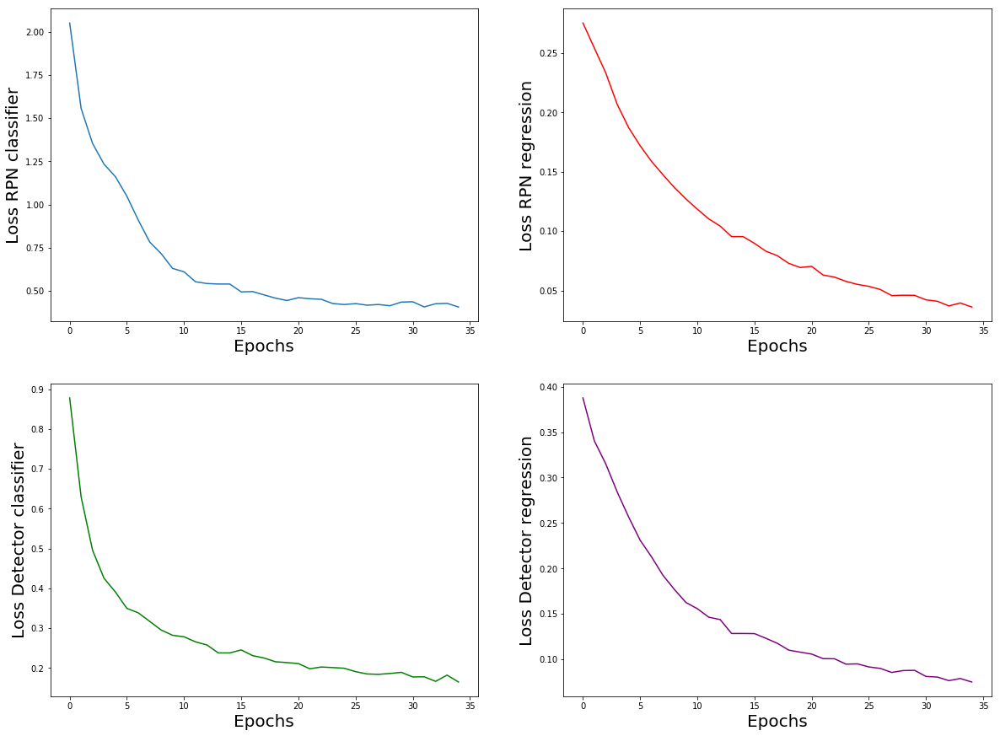

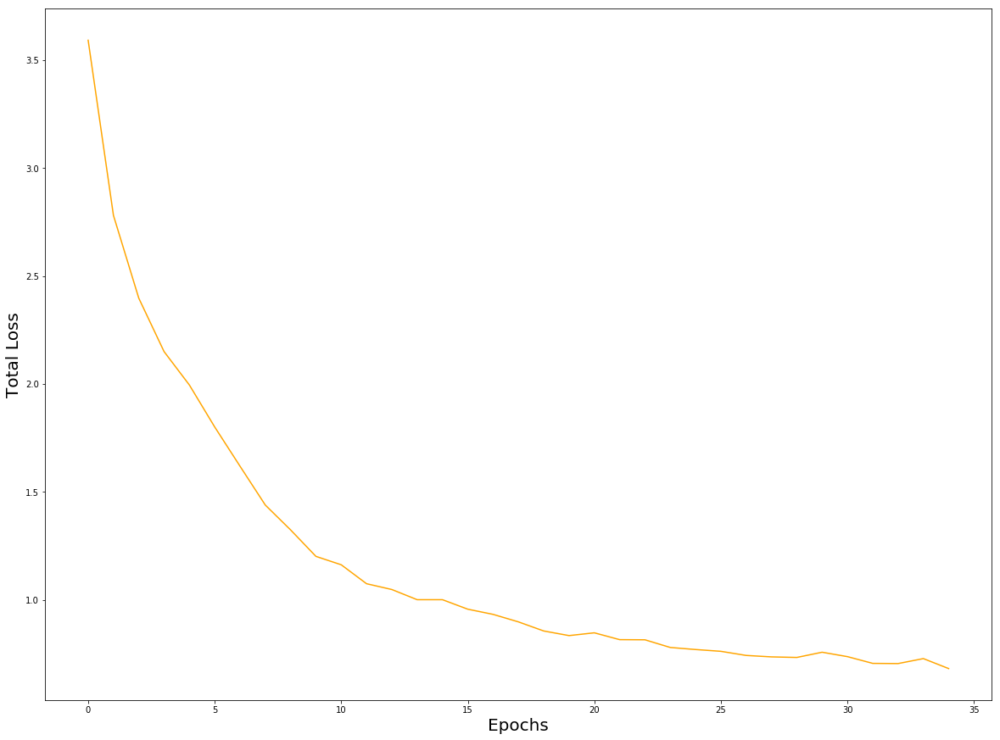

In [105]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(20, 15))
plt.subplot(221)
plt.plot(rpn_cls)
plt.xlabel('Epochs', fontsize = 20)
plt.ylabel('Loss RPN classifier', fontsize = 20)
plt.subplot(222)
plt.plot(rpn_regr, c='red')
plt.xlabel('Epochs', fontsize = 20)
plt.ylabel('Loss RPN regression', fontsize = 20)
plt.subplot(223)
plt.plot(detector_cls, c = 'green')
plt.xlabel('Epochs', fontsize = 20)
plt.ylabel('Loss Detector classifier', fontsize = 20)
plt.subplot(224)
plt.plot(detector_regr, c = 'purple')
plt.xlabel('Epochs', fontsize = 20)
plt.ylabel('Loss Detector regression', fontsize = 20)
plt.show()

fig = plt.figure(figsize=(20, 15))
plt.plot(total_loss, c = 'orange')
plt.xlabel('Epochs', fontsize = 20)
plt.ylabel('Total Loss', fontsize = 20)
plt.show()

In [97]:
total_loss

array([3.59156561, 2.78052953, 2.3976688 , 2.15017118, 1.99555612,
       1.80136095, 1.61974582, 1.43981451, 1.32467285, 1.20224953,
       1.1633653 , 1.07568686, 1.04881617, 1.00173742, 1.00173742,
       0.95778093, 0.93379544, 0.89906698, 0.85694593, 0.8355484 ,
       0.8484151 , 0.81678605, 0.81611865, 0.78058261, 0.77106784,
       0.76275386, 0.74368255, 0.73695885, 0.73437341, 0.75854461,
       0.73816445, 0.70696966, 0.70602616, 0.72906841, 0.68287683])

To train a Faster-RCNN neural network for object detection for just 20 epochs took approximately one week on my laptop with 4 cores, one epoch took approximately 6-7 hours. Let us now use the trained network for predicting locations and classes of the cells on the images from the test data set:

In [ ]:
%%bash
python test_frcnn.py -p test

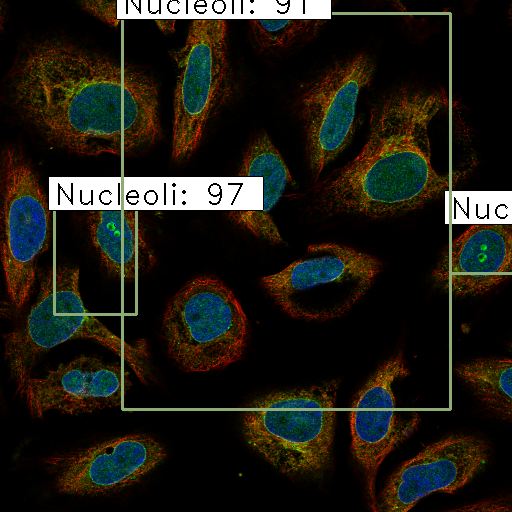

In [91]:
from IPython.display import Image
Image('/home/nikolay/WABI/Misc/HPA/keras-frcnn/results_imgs_20epochs/0.png', width=2000)

Displaying the results of Faster-RCNN only with high detection accuracy (over 80% probability) we can see that the network could correctly identify two cells with protein expressed in the Nucleoli region and made a false prediction for the third region (no cell with Nucleoli in this region in fact). Moreover, the localization with bounding boxes seems to be quite off especially for the third falsly predicted region. This is my general impression about the Faster-RCNN: it is quite ok for object classification but not as accurate with object localization, this might be due to short training. Another reson for problems with object localization might be because I annotated not all cells on each image and the remained cells without bounding boxes are treated by the network as a background thus confusing object detection.

### Object Detection with Mask-RCNN  <a class="anchor" id="Object-Detection-with-Mask-RCNN"></a>

Faster RCNN is an easy-to-use neural network however is not really fast. It took me more than one week to train it for only around 30 epochs on my laptop with 4 cores. This is the case where you really need GPU, Google Colab seems like a nice option, however I always have troubles with transfering files and loosing connection after some time which is a bit annoying. Here I desided to try a newer object detection algorithm which is called Mask-RCNN, it also belongs the RCNN family but can also do object segmentation (not only detection with bounding box) on the fly. As previously, we begin with extracting bounding boxes from the xml annotation files:

In [12]:
import os
from xml.etree import ElementTree

os.chdir('/home/nikolay/WABI/Misc/HPA/')

def extract_boxes(filename):
    tree = ElementTree.parse(filename)
    root = tree.getroot()
    boxes = list()
    for box in root.findall('.//bndbox'):
        xmin = int(box.find('xmin').text)
        ymin = int(box.find('ymin').text)
        xmax = int(box.find('xmax').text)
        ymax = int(box.find('ymax').text)
        coors = [xmin, ymin, xmax, ymax]
        boxes.append(coors)
    width = int(root.find('.//size/width').text)
    height = int(root.find('.//size/height').text)
    
    my_classes = list()    
    for name in root.findall('.//object'):
        my_classes.append(name.find('name').text)
    
    return boxes, width, height, my_classes
 
boxes, w, h, my_classes = extract_boxes('train_annot/0a3028e6-bbca-11e8-b2bc-ac1f6b6435d0.xml')
print(boxes, w, h, my_classes)

[[317, 410, 411, 507], [230, 311, 400, 389], [92, 473, 204, 512], [246, 163, 377, 300], [55, 81, 158, 186], [380, 36, 491, 163], [147, 157, 239, 272], [68, 303, 178, 412], [452, 324, 512, 420], [222, 1, 334, 72]] 512 512 ['Nucleoli', 'Not Nucleoli', 'Nucleoli', 'Not Nucleoli', 'Not Nucleoli', 'Nucleoli', 'Not Nucleoli', 'Not Nucleoli', 'Not Nucleoli', 'Not Nucleoli']


The function extracting bounding boxes seems to be working fine, we get coordinates and dimensions of the images. Next we will start preparing dataset for training, this will involve a lot of coding compared to Faster-RCNN which is a more like stand-alone tool. In contrast Mask RCNN gives you a better feeling of how the data are processed and trained. The peculiarity of Mask-RCNN is that the data are handled by a mrcnn.utils.Dataset object which will be used for feeding it into the Mask-RCNN for training and testing. For this purpose we need to modify the built-in class mrcnn.utils.Dataset and re-define functions for loading the dataset called "load_dataset", loading a mask called "load_mask" and loading a path to the data set called "image_reference". We actually aim here at object detection and not segmentation therefore we pretend that the bounding boxes are actually masks, so the "load_mask" function will load in fact bounding boxes coordinates.

In [47]:
from os import listdir
from numpy import zeros
from numpy import asarray
from mrcnn.utils import Dataset
 
# class that defines and loads the HPA dataset
class HPADataset(Dataset):

    def load_dataset(self, dataset_dir, is_train=True):
        # define classes present on HPA images
        self.add_class("dataset", 1, "Nucleoli")
        self.add_class("dataset", 2, "Not Nucleoli")
        # define data locations
        annotations_dir = dataset_dir + 'train_annot/'
        images_dir = dataset_dir + 'train/'
        #if is_train:
        #    images_dir = dataset_dir + 'train/'
        #else:
        #    images_dir = dataset_dir + 'test/'
        
        # find all images
        for i,filename in zip(range(len(listdir(images_dir))),listdir(images_dir)):
            # extract image id
            image_id = filename[:-4]
            # skip all images after 40 if we are building the train set
            if is_train and i >= 40:
                continue
            # skip all images before 40 if we are building the test/val set
            if not is_train and i < 40:
                continue
        
            img_path = images_dir + filename
            ann_path = annotations_dir + image_id + '.xml'
            # add to dataset
            self.add_image('dataset', image_id=image_id, path=img_path, annotation=ann_path)
 
    def load_mask(self, image_id):
        # get details of image
        info = self.image_info[image_id]
        # define box file location
        path = info['annotation']
        # load XML
        boxes, w, h, my_classes = extract_boxes(path)
        # create one array for all masks, each on a different channel
        masks = zeros([h, w, len(boxes)], dtype='uint8')
        # create masks
        class_ids = list()
        for i in range(len(boxes)):
            box = boxes[i]
            row_s, row_e = box[1], box[3]
            col_s, col_e = box[0], box[2]
            masks[row_s:row_e, col_s:col_e, i] = 1
            if my_classes[i]=='Nucleoli':
                class_ids.append(self.class_names.index('Nucleoli'))
            else:
                class_ids.append(self.class_names.index('Not Nucleoli'))
        return masks, asarray(class_ids, dtype='int32')
 
    # load an image reference
    def image_reference(self, image_id):
        info = self.image_info[image_id]
        return info['path']

# train set
train_set = HPADataset()
train_set.load_dataset('/home/nikolay/WABI/Misc/HPA/', is_train=True)
train_set.prepare()
print('Train: %d' % len(train_set.image_ids))
 
# test/val set
test_set = HPADataset()
test_set.load_dataset('/home/nikolay/WABI/Misc/HPA/', is_train=False)
test_set.prepare()
print('Test: %d' % len(test_set.image_ids))

Train: 40
Test: 5


Now let us make sure that the images and masks can be loaded correctly. For this purpose, we will display an images and overlay the first mask / bounding box on that image. We will also check that the dimensions of the images and masks make sense:

(512, 512, 3)
(512, 512, 15)


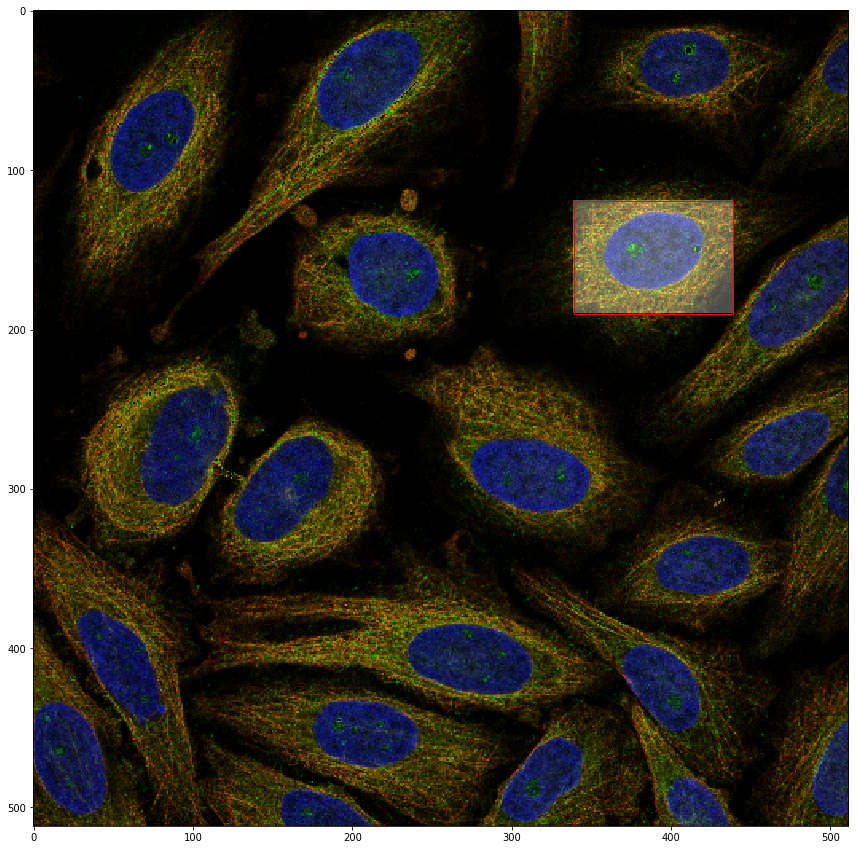

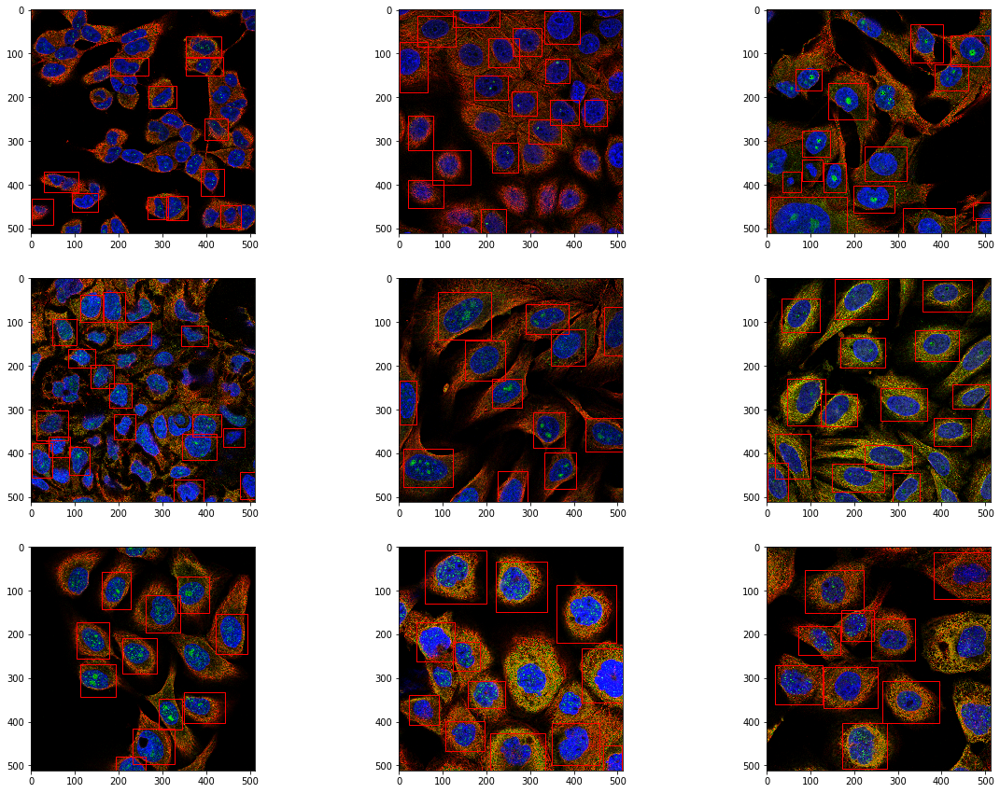

In [38]:
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

# train set
train_set = HPADataset()
train_set.load_dataset('/home/nikolay/WABI/Misc/HPA/', is_train=True)
train_set.prepare()

# load an image
image_id = 5
image = train_set.load_image(image_id)
print(image.shape)
# load image mask
mask, class_ids, boxes = train_set.load_mask(image_id)
print(mask.shape)

# plot image
fig = plt.figure(figsize=(20, 15))
ax = plt.gca()
plt.imshow(image)
# plot mask
plt.imshow(mask[:, :, 0], cmap='gray', alpha=0.3)
x1, y1, x2, y2 = boxes[0]
width, height = x2 - x1, y2 - y1
rect = Rectangle((x1, y1), width, height, fill=False, color='red')
ax.add_patch(rect)
plt.show()

fig = plt.figure(figsize=(20, 15))
for i in range(9):
    plt.subplot(330 + 1 + i)
    image = train_set.load_image(i)
    plt.imshow(image)
    mask, _, boxes = train_set.load_mask(i)
    for j in range(mask.shape[2]):
        ax = plt.gca()
        x1, y1, x2, y2 = boxes[j]
        width, height = x2 - x1, y2 - y1
        rect = Rectangle((x1, y1), width, height, fill=False, color='red')
        ax.add_patch(rect)

plt.show()

Everything looks fine, the dimensions of the images are ok and the mask has the same dimensions as the image and the channels correspond to bounding boxes, there are indeed 15 bounding boxes annotated for that image. Here we also displayed a few first images with bounding boxes put on the top of the images, they look as they should and select the areas of the cells.

In [39]:
# enumerate all images in the dataset
for image_id in train_set.image_ids[0:10]:
    # load image info
    info = train_set.image_info[image_id]
    # display on the console
    print(info)

{'id': '0ade9450-bbaa-11e8-b2ba-ac1f6b6435d0', 'source': 'dataset', 'path': '/home/nikolay/WABI/Misc/HPA/train/0ade9450-bbaa-11e8-b2ba-ac1f6b6435d0.png', 'annotation': '/home/nikolay/WABI/Misc/HPA/train_annot/0ade9450-bbaa-11e8-b2ba-ac1f6b6435d0.xml'}
{'id': '0e947f1e-bbab-11e8-b2ba-ac1f6b6435d0', 'source': 'dataset', 'path': '/home/nikolay/WABI/Misc/HPA/train/0e947f1e-bbab-11e8-b2ba-ac1f6b6435d0.png', 'annotation': '/home/nikolay/WABI/Misc/HPA/train_annot/0e947f1e-bbab-11e8-b2ba-ac1f6b6435d0.xml'}
{'id': '00b1b8b8-bba5-11e8-b2ba-ac1f6b6435d0', 'source': 'dataset', 'path': '/home/nikolay/WABI/Misc/HPA/train/00b1b8b8-bba5-11e8-b2ba-ac1f6b6435d0.png', 'annotation': '/home/nikolay/WABI/Misc/HPA/train_annot/00b1b8b8-bba5-11e8-b2ba-ac1f6b6435d0.xml'}
{'id': '0b93e320-bb9e-11e8-b2b9-ac1f6b6435d0', 'source': 'dataset', 'path': '/home/nikolay/WABI/Misc/HPA/train/0b93e320-bb9e-11e8-b2b9-ac1f6b6435d0.png', 'annotation': '/home/nikolay/WABI/Misc/HPA/train_annot/0b93e320-bb9e-11e8-b2b9-ac1f6b6435d

We have used the hand-made way of displaying images with overlapping bounding boxes, however this is not really needed as Mask-RCNN library provides a handy function for that. The useful thing is that this function puts the class label on the top of each mask / bounding box, let us demonstrate how it works:

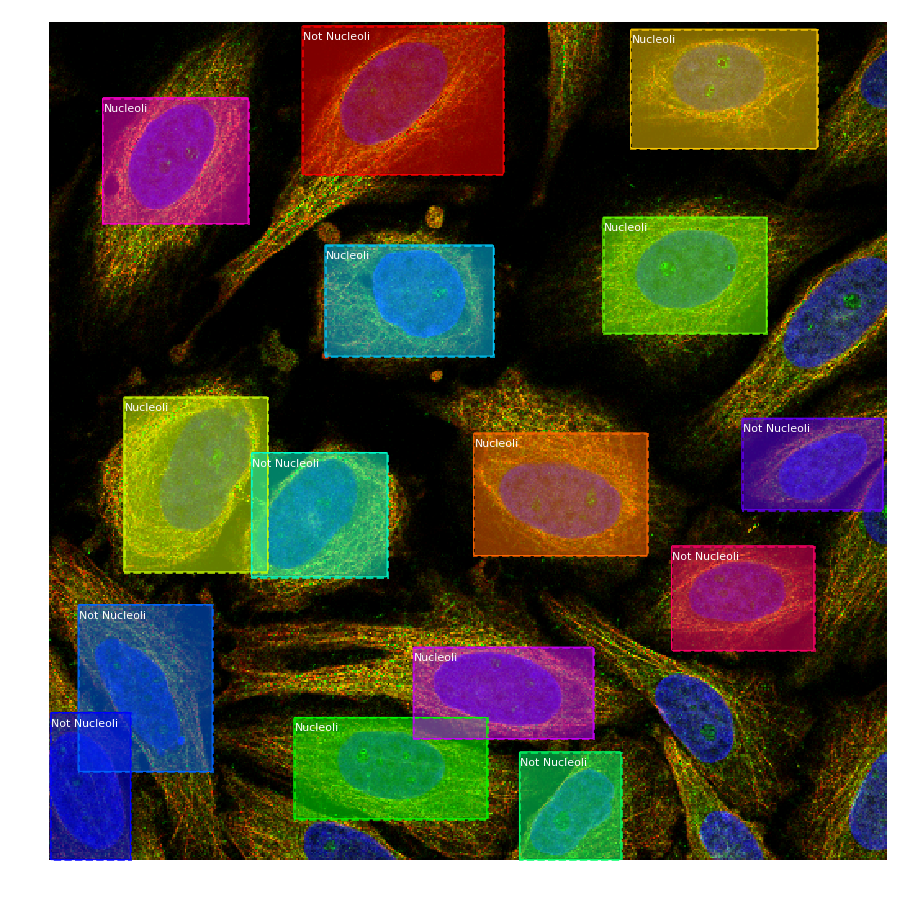

In [40]:
from mrcnn.visualize import display_instances
from mrcnn.utils import extract_bboxes

image_id = 5
image = train_set.load_image(image_id)
mask, class_ids, _ = train_set.load_mask(image_id)
# extract bounding boxes from the masks and display image with masks and bounding boxes
bbox = extract_bboxes(mask)
display_instances(image, bbox, mask, class_ids, train_set.class_names)

Now everything is ready for training the Mask-RCNN model. We will use transfer learning and start from weights from the pre-trained object detection Mask-RCNN model on COCO data set. To start training we need to re-define the built-in configuration mrcnn.config.Config class.

In [48]:
from mrcnn.config import Config
from mrcnn.model import MaskRCNN

import warnings
warnings.filterwarnings("ignore")

class HPAConfig(Config):
    NAME = "hpa_cfg"
    # Number of classes (background + Nucleoli + Not Nucleoli)
    NUM_CLASSES = 1 + 1 + 1
    # Number of training steps per epoch: number of images in the training data set
    STEPS_PER_EPOCH = 40

# prepare config
config = HPAConfig()
# define the model
model = MaskRCNN(mode='training', model_dir='/home/nikolay/WABI/Misc/HPA/', config=config)
# load weights (mscoco)
model.load_weights('/home/nikolay/WABI/Misc/HPA/mask_rcnn_coco.h5', by_name=True, 
                   exclude=["mrcnn_class_logits", "mrcnn_bbox_fc",  "mrcnn_bbox", "mrcnn_mask"])
# train weights (output layers or 'heads')
model.train(train_set, test_set, learning_rate=config.LEARNING_RATE, epochs=5, layers='heads')


Starting at epoch 0. LR=0.001

Checkpoint Path: /home/nikolay/WABI/Misc/HPA/hpa_cfg20190705T1450/mask_rcnn_hpa_cfg_{epoch:04d}.h5
Selecting layers to train
fpn_c5p5               (Conv2D)
fpn_c4p4               (Conv2D)
fpn_c3p3               (Conv2D)
fpn_c2p2               (Conv2D)
fpn_p5                 (Conv2D)
fpn_p2                 (Conv2D)
fpn_p3                 (Conv2D)
fpn_p4                 (Conv2D)
In model:  rpn_model
    rpn_conv_shared        (Conv2D)
    rpn_class_raw          (Conv2D)
    rpn_bbox_pred          (Conv2D)
mrcnn_mask_conv1       (TimeDistributed)
mrcnn_mask_bn1         (TimeDistributed)
mrcnn_mask_conv2       (TimeDistributed)
mrcnn_mask_bn2         (TimeDistributed)
mrcnn_class_conv1      (TimeDistributed)
mrcnn_class_bn1        (TimeDistributed)
mrcnn_mask_conv3       (TimeDistributed)
mrcnn_mask_bn3         (TimeDistributed)
mrcnn_class_conv2      (TimeDistributed)
mrcnn_class_bn2        (TimeDistributed)
mrcnn_mask_conv4       (TimeDistributed)
mrcnn_m

Now after we have trained the model, we can use the test images in order to detect cells with protein expressed in Nucleoli and cells with protein expressed outside of Nucleoli. For this purpose we will use "model.detect" function and we also need to define prediction configuration class. The config must change some of the defaults around using the GPU for inference that are different from how they are set for training a model (regardless of whether you are running on the GPU or CPU).

Train: 45
Test: 5
Re-starting from epoch 5


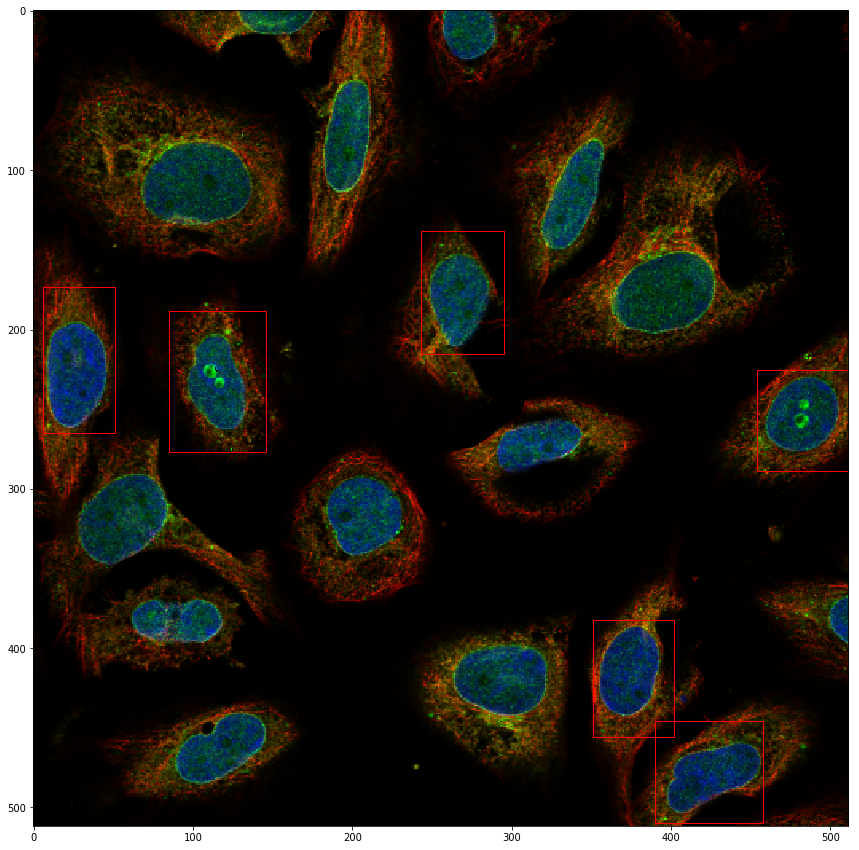

In [85]:
from os import listdir
from numpy import zeros
from numpy import asarray
from numpy import expand_dims
import matplotlib.pyplot as plt
from mrcnn.utils import Dataset
from mrcnn.config import Config
from mrcnn.model import mold_image
from matplotlib.patches import Rectangle
 
# class that defines and loads the HPA dataset
class HPADataset(Dataset):

    def load_dataset(self, dataset_dir, is_train=True):
        # define classes present on HPA images
        self.add_class("dataset", 1, "Nucleoli")
        self.add_class("dataset", 2, "Not Nucleoli")
        # define data locations
        annotations_dir = dataset_dir + 'train_annot/'
        #images_dir = dataset_dir + 'train/'
        if is_train:
            images_dir = dataset_dir + 'train/'
        else:
            images_dir = dataset_dir + 'test/'
        
        # find all images
        for i,filename in zip(range(len(listdir(images_dir))),listdir(images_dir)):
            # extract image id
            image_id = filename[:-4]
            img_path = images_dir + filename
            ann_path = annotations_dir + image_id + '.xml'
            # add to dataset
            self.add_image('dataset', image_id=image_id, path=img_path, annotation=ann_path)
 
    def load_mask(self, image_id):
        # get details of image
        info = self.image_info[image_id]
        # define box file location
        path = info['annotation']
        # load XML
        boxes, w, h, my_classes = extract_boxes(path)
        # create one array for all masks, each on a different channel
        masks = zeros([h, w, len(boxes)], dtype='uint8')
        # create masks
        class_ids = list()
        for i in range(len(boxes)):
            box = boxes[i]
            row_s, row_e = box[1], box[3]
            col_s, col_e = box[0], box[2]
            masks[row_s:row_e, col_s:col_e, i] = 1
            if my_classes[i]=='Nucleoli':
                class_ids.append(self.class_names.index('Nucleoli'))
            else:
                class_ids.append(self.class_names.index('Not Nucleoli'))
        return masks, asarray(class_ids, dtype='int32')
 
    # load an image reference
    def image_reference(self, image_id):
        info = self.image_info[image_id]
        return info['path']

# train set
train_set = HPADataset()
train_set.load_dataset('/home/nikolay/WABI/Misc/HPA/', is_train=True)
train_set.prepare()
print('Train: %d' % len(train_set.image_ids))
 
# test/val set
test_set = HPADataset()
test_set.load_dataset('/home/nikolay/WABI/Misc/HPA/', is_train=False)
test_set.prepare()
print('Test: %d' % len(test_set.image_ids))


class PredictionConfig(Config):
    NAME = "hpa_cfg"
    # Number of classes (background + Nucleoli + Not Nucleoli)
    NUM_CLASSES = 1 + 1 + 1
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

cfg = PredictionConfig()
model = MaskRCNN(mode='inference', model_dir='/home/nikolay/WABI/Misc/HPA/', config=cfg)
model.load_weights('/home/nikolay/WABI/Misc/HPA/hpa_cfg20190705T1450/mask_rcnn_hpa_cfg_0005.h5', 
                   by_name=True)
#plot_actual_vs_predicted(test_set, model, cfg)

image_id = 2
image = test_set.load_image(image_id)
#mask, class_ids = test_set.load_mask(image_id)
# convert pixel values (e.g. center)
scaled_image = mold_image(image, cfg)
# convert image into one sample
sample = expand_dims(scaled_image, 0)
yhat = model.detect(sample, verbose=0)[0]

fig = plt.figure(figsize=(20, 15))
plt.imshow(image)
ax = plt.gca()
for box in yhat['rois']:
    y1, x1, y2, x2 = box
    width, height = x2 - x1, y2 - y1
    rect = Rectangle((x1, y1), width, height, fill=False, color='red')
    ax.add_patch(rect)

plt.show()

In [86]:
yhat

{'rois': array([[382, 351, 456, 402],
        [225, 454, 289, 512],
        [173,   6, 265,  51],
        [188,  85, 277, 146],
        [446, 390, 510, 458],
        [138, 243, 215, 295]], dtype=int32),
 'class_ids': array([1, 1, 2, 1, 2, 2], dtype=int32),
 'scores': array([0.8621774 , 0.84486455, 0.80363303, 0.79287827, 0.7636217 ,
        0.7306389 ], dtype=float32),
 'masks': array([[[False, False, False, False, False, False],
         [False, False, False, False, False, False],
         [False, False, False, False, False, False],
         ...,
         [False, False, False, False, False, False],
         [False, False, False, False, False, False],
         [False, False, False, False, False, False]],
 
        [[False, False, False, False, False, False],
         [False, False, False, False, False, False],
         [False, False, False, False, False, False],
         ...,
         [False, False, False, False, False, False],
         [False, False, False, False, False, False],
     

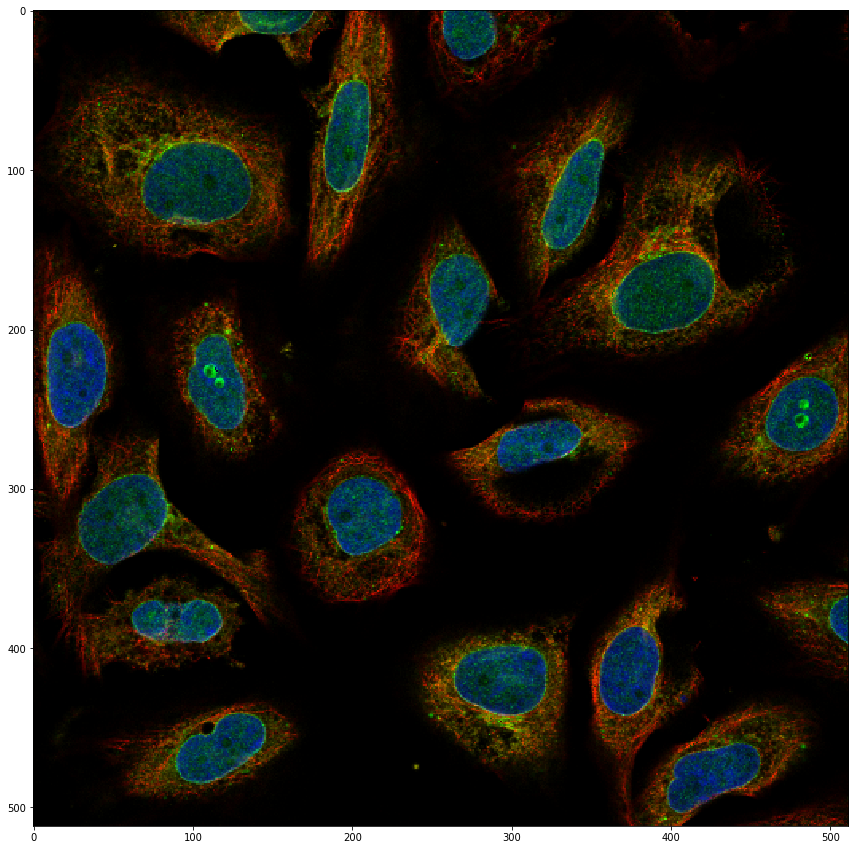

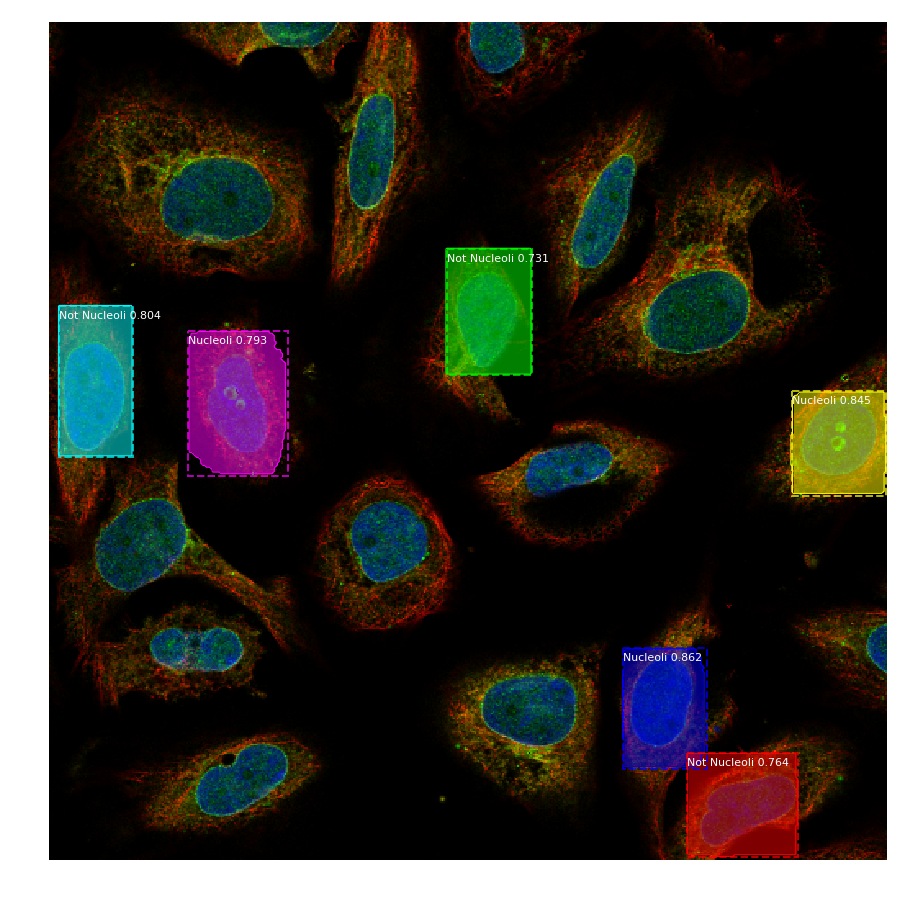

In [87]:
from mrcnn.visualize import display_instances
from mrcnn.utils import extract_bboxes

#image_id = 0
#image = test_set.load_image(image_id)
#mask, class_ids, _ = test_set.load_mask(image_id)
# extract bounding boxes from the masks and display image with masks and bounding boxes
#bbox = extract_bboxes(mask)

fig = plt.figure(figsize=(20, 15))
plt.imshow(image)
display_instances(image, yhat['rois'], yhat['masks'], yhat['class_ids'], test_set.class_names, yhat['scores'])

Here we displayed only the objects detected with high accuracy (over 70% probability). The results of Mask-RCNN look much better than for Faster-RCNN, the model seems to put the bounding boxes quite accurately and the calssification is tolerable as well. In addition, the Mask-RCNN model took only 10 hours to train for 5 epochs which is 3X faster than Faster-RCNN. The disadvantage of Mask-RCNN is that it is relatively lots of coding while to train a Faster-RCNN model is basically to press one button once the annotation file is prepared.

### Multi-Label Classification of HPA Images  <a class="anchor" id="Multi-Label-Classification-of-HPA-Images"></a>

Now after we have had a look a the images, let us read the training data into the memory and prepare it for training. First, we will fix the labels for the HPA images. We need a mapping of training set filenames to the tags for the image. This is a simple dictionary with the filename of the image as the key and the list of tags as the value.

In [8]:
def create_file_mapping(mapping_csv):
    file_mapping = dict()
    for i in range(len(mapping_csv)):
        name, tags = mapping_csv['Id'][i], mapping_csv['Target'][i]
        file_mapping[name] = tags.split(' ')
    return file_mapping

In [9]:
import pandas as pd
annot = pd.read_csv('/home/nikolay/WABI/Misc/HPA/train.csv')
annot.head()

,Id,Target
0,00070df0-bbc3-11e8-b2bc-ac1f6b6435d0,16 0
1,000a6c98-bb9b-11e8-b2b9-ac1f6b6435d0,7 1 2 0
2,000a9596-bbc4-11e8-b2bc-ac1f6b6435d0,5
3,000c99ba-bba4-11e8-b2b9-ac1f6b6435d0,1
4,001838f8-bbca-11e8-b2bc-ac1f6b6435d0,18


In [10]:
file_mapping = create_file_mapping(annot)
file_mapping

{'00070df0-bbc3-11e8-b2bc-ac1f6b6435d0': ['16', '0'],
 '000a6c98-bb9b-11e8-b2b9-ac1f6b6435d0': ['7', '1', '2', '0'],
 '000a9596-bbc4-11e8-b2bc-ac1f6b6435d0': ['5'],
 '000c99ba-bba4-11e8-b2b9-ac1f6b6435d0': ['1'],
 '001838f8-bbca-11e8-b2bc-ac1f6b6435d0': ['18'],
 '001bcdd2-bbb2-11e8-b2ba-ac1f6b6435d0': ['0'],
 '0020af02-bbba-11e8-b2ba-ac1f6b6435d0': ['25', '2'],
 '002679c2-bbb6-11e8-b2ba-ac1f6b6435d0': ['0'],
 '00285ce4-bba0-11e8-b2b9-ac1f6b6435d0': ['2', '0'],
 '002daad6-bbc9-11e8-b2bc-ac1f6b6435d0': ['7'],
 '002ff91e-bbb8-11e8-b2ba-ac1f6b6435d0': ['23'],
 '00301238-bbb2-11e8-b2ba-ac1f6b6435d0': ['21'],
 '0032a07e-bba9-11e8-b2ba-ac1f6b6435d0': ['24', '0'],
 '00344514-bbc2-11e8-b2bb-ac1f6b6435d0': ['23'],
 '00357b1e-bba9-11e8-b2ba-ac1f6b6435d0': ['6', '2'],
 '00383b44-bbbb-11e8-b2ba-ac1f6b6435d0': ['25'],
 '0038d6a6-bb9a-11e8-b2b9-ac1f6b6435d0': ['25', '0'],
 '003957a8-bbb7-11e8-b2ba-ac1f6b6435d0': ['25'],
 '003feb6e-bbca-11e8-b2bc-ac1f6b6435d0': ['0'],
 '0042017c-bba4-11e8-b2b9-ac1f6b6

In [11]:
len(file_mapping)

31072

In [12]:
name_label_dict = {
0:  'Nucleoplasm',
1:  'Nuclear membrane',
2:  'Nucleoli',   
3:  'Nucleoli fibrillar center',
4:  'Nuclear speckles',
5:  'Nuclear bodies',
6:  'Endoplasmic reticulum',   
7:  'Golgi apparatus',
8:  'Peroxisomes',
9:  'Endosomes',
10:  'Lysosomes',
11:  'Intermediate filaments',
12:  'Actin filaments',
13:  'Focal adhesion sites',   
14:  'Microtubules',
15:  'Microtubule ends',  
16:  'Cytokinetic bridge',   
17:  'Mitotic spindle',
18:  'Microtubule organizing center',  
19:  'Centrosome',
20:  'Lipid droplets',
21:  'Plasma membrane',   
22:  'Cell junctions', 
23:  'Mitochondria',
24:  'Aggresome',
25:  'Cytosol',
26:  'Cytoplasmic bodies',   
27:  'Rods & rings' }

In [13]:
label_keys = list()
for keys, values in name_label_dict.items():
    label_keys.append(keys)
print(label_keys)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27]


In [14]:
def one_hot_encode(id):
    tags = file_mapping[id]
    encoding = np.zeros(len(label_keys), dtype='uint8')
    for tag in tags:
        encoding[int(tag)] = 1
    return encoding

In [15]:
one_hot_encode('00070df0-bbc3-11e8-b2bc-ac1f6b6435d0')

array([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0], dtype=uint8)

In [16]:
import os
from numpy import zeros
from numpy import asarray
from numpy import savez_compressed
from pandas import read_csv
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array

photos = list()
labels = list()
path = '/home/nikolay/WABI/Misc/HPA/train/'
ids = os.listdir(path)
ids = list(set([i.split('_')[0] for i in ids]))
for my_id in ids:
    #photo = load_img(path + filename, target_size=(256,256))
    photo = open_rgby('/home/nikolay/WABI/Misc/HPA/train/', my_id)
    photo = img_to_array(photo)
    photo = cv2.resize(photo, (256, 256))
    photos.append(photo)
    labels.append(one_hot_encode(my_id))

X = asarray(photos, dtype='uint8')
print(X.shape)
y = asarray(labels, dtype='uint8')
print(y.shape)

Using TensorFlow backend.


(2500, 256, 256, 4)
(2500, 28)


In [17]:
ids

['0b4bec30-bbb9-11e8-b2ba-ac1f6b6435d0',
 '008a780e-bb9e-11e8-b2b9-ac1f6b6435d0',
 '070835b6-bbaf-11e8-b2ba-ac1f6b6435d0',
 '0ae791ea-bbc3-11e8-b2bc-ac1f6b6435d0',
 '05b55262-bbb3-11e8-b2ba-ac1f6b6435d0',
 '072d1418-bbc7-11e8-b2bc-ac1f6b6435d0',
 '130bf642-bba3-11e8-b2b9-ac1f6b6435d0',
 '03de37e6-bbaf-11e8-b2ba-ac1f6b6435d0',
 '03e0b692-bbaf-11e8-b2ba-ac1f6b6435d0',
 '0aab505c-bb9d-11e8-b2b9-ac1f6b6435d0',
 '09a4622e-bbc6-11e8-b2bc-ac1f6b6435d0',
 '093c30ac-bbab-11e8-b2ba-ac1f6b6435d0',
 '052ce424-bbb1-11e8-b2ba-ac1f6b6435d0',
 '0d00a76a-bb9f-11e8-b2b9-ac1f6b6435d0',
 '130c7332-bba4-11e8-b2b9-ac1f6b6435d0',
 '034a37f8-bbc3-11e8-b2bc-ac1f6b6435d0',
 '06797a62-bba3-11e8-b2b9-ac1f6b6435d0',
 '0396a062-bbc7-11e8-b2bc-ac1f6b6435d0',
 '08543dfe-bba3-11e8-b2b9-ac1f6b6435d0',
 '0d6f9fb8-bbbc-11e8-b2ba-ac1f6b6435d0',
 '1433463e-bbc0-11e8-b2bb-ac1f6b6435d0',
 '11b54f76-bba5-11e8-b2ba-ac1f6b6435d0',
 '0a42335c-bb9c-11e8-b2b9-ac1f6b6435d0',
 '09378600-bbca-11e8-b2bc-ac1f6b6435d0',
 '0eb6f224-bbb5-

In [18]:
file_mapping['0b4bec30-bbb9-11e8-b2ba-ac1f6b6435d0']

['5', '21']

In [25]:
np.max(X[0,:,:,:])

233

In [26]:
y[0]

array([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0], dtype=uint8)

As usually let us spli the data set into train and test sub-sets:

In [27]:
from sklearn.model_selection import train_test_split
trainX, testX, trainY, testY = train_test_split(X, y, test_size=0.3, random_state=1)
print(trainX.shape)
print(trainY.shape)
print()
print(testX.shape)
print(testY.shape)

(1750, 256, 256, 4)
(1750, 28)

(750, 256, 256, 4)
(750, 28)


Now we define the fbeta-score as an evaluation metric and create a stupid "all-one" model and check the fbeta-score metric for this model:

In [28]:
from sklearn.metrics import fbeta_score
# make all one predictions
train_yhat = asarray([np.ones(trainY.shape[1]) for _ in range(trainY.shape[0])])
test_yhat = asarray([np.ones(testY.shape[1]) for _ in range(testY.shape[0])])
# evaluate predictions
train_score = fbeta_score(trainY, train_yhat, 2, average= 'samples')
test_score = fbeta_score(testY, test_yhat, 2, average= 'samples')
print('All Ones: train=%.3f, test=%.3f' % (train_score, test_score))

All Ones: train=0.233, test=0.230


In [29]:
from keras import backend
# calculate fbeta score for multiclass/label classification
def fbeta(y_true, y_pred, beta=2):
    # clip predictions
    y_pred = backend.clip(y_pred, 0, 1)
    # calculate elements
    tp = backend.sum(backend.round(backend.clip(y_true * y_pred, 0, 1)), axis=1)
    fp = backend.sum(backend.round(backend.clip(y_pred - y_true, 0, 1)), axis=1)
    fn = backend.sum(backend.round(backend.clip(y_true - y_pred, 0, 1)), axis=1)
    # calculate precision
    p = tp / (tp + fp + backend.epsilon())
    # calculate recall
    r = tp / (tp + fn + backend.epsilon())
    # calculate fbeta, averaged across each class
    bb = beta ** 2
    fbeta_score = backend.mean((1 + bb) * (p * r) / (bb * p + r + backend.epsilon()))
    return fbeta_score

In [30]:
# evaluate predictions with keras
train_score = fbeta(backend.variable(trainY),
backend.variable(train_yhat)).eval(session=backend.get_session())
test_score = fbeta(backend.variable(testY),
backend.variable(test_yhat)).eval(session=backend.get_session())
print('All Ones (keras): train=%.3f, test=%.3f' % (train_score, test_score))

All Ones (keras): train=0.233, test=0.230


In [31]:
import sys
from numpy import load
from matplotlib import pyplot
from sklearn.model_selection import train_test_split
from keras import backend
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Conv2D
from keras.layers import MaxPooling2D
from keras.layers import Dense
from keras.layers import Flatten
from keras.optimizers import SGD

In [32]:
# define cnn model
def define_model(in_shape=(256, 256, 4), out_shape=28):
    model = Sequential()
    model.add(Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', 
                     padding='same', input_shape=in_shape))
    model.add(Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', 
                     padding='same'))
    model.add(MaxPooling2D((2, 2)))
    #model.add(Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', 
    #                 padding='same'))
    #model.add(Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', 
    #                 padding='same'))
    #model.add(MaxPooling2D((2, 2)))
    #model.add(Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_uniform',
    #                 padding='same'))
    #model.add(Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_uniform',
    #                 padding='same'))
    #model.add(MaxPooling2D((2, 2)))
    model.add(Flatten())
    model.add(Dense(32, activation='relu', kernel_initializer='he_uniform'))
    model.add(Dense(out_shape, activation='sigmoid'))
    # compile model
    opt = SGD(lr=0.01, momentum=0.9)
    model.compile(optimizer=opt, loss='binary_crossentropy', metrics=[fbeta])
    return model

Epoch 1/10
55/55 [==============================] - 873s 16s/step - loss: 0.2865 - fbeta: 0.0989 - val_loss: 0.1864 - val_fbeta: 0.0128
Epoch 2/10
55/55 [==============================] - 902s 16s/step - loss: 0.1783 - fbeta: 0.0524 - val_loss: 0.1706 - val_fbeta: 0.0641
Epoch 3/10
55/55 [==============================] - 957s 17s/step - loss: 0.1674 - fbeta: 0.0846 - val_loss: 0.1704 - val_fbeta: 0.0264
Epoch 4/10
55/55 [==============================] - 979s 18s/step - loss: 0.1623 - fbeta: 0.1062 - val_loss: 0.1697 - val_fbeta: 0.0854
Epoch 5/10
55/55 [==============================] - 902s 16s/step - loss: 0.1543 - fbeta: 0.1318 - val_loss: 0.1674 - val_fbeta: 0.1136
Epoch 6/10
55/55 [==============================] - 993s 18s/step - loss: 0.1456 - fbeta: 0.1889 - val_loss: 0.1706 - val_fbeta: 0.1572
Epoch 7/10
55/55 [==============================] - 915s 17s/step - loss: 0.1351 - fbeta: 0.2226 - val_loss: 0.1723 - val_fbeta: 0.2058
Epoch 8/10
55/55 [==============================

<Figure size 1440x1080 with 0 Axes>

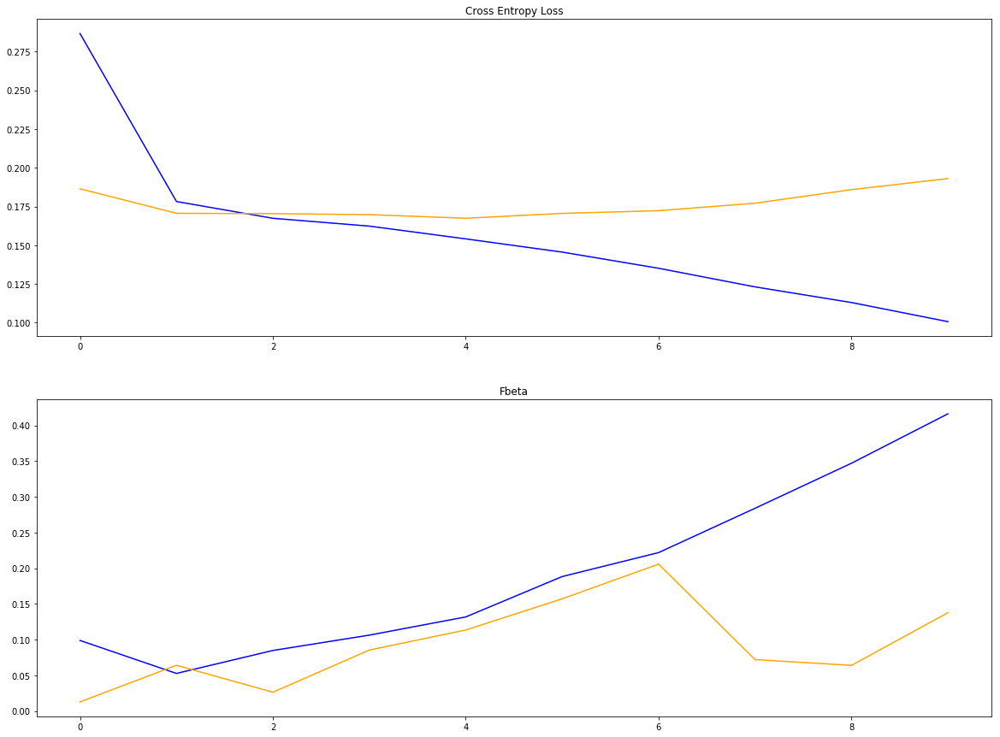

In [33]:
from matplotlib import pyplot

def summarize_diagnostics(history):
    # plot loss
    pyplot.figure(figsize=(20,15))
    pyplot.subplot(211)
    pyplot.title('Cross Entropy Loss')
    pyplot.plot(history.history['loss'], color='blue', label='train')
    pyplot.plot(history.history['val_loss'], color='orange', label='test')
    # plot accuracy
    pyplot.subplot(212)
    pyplot.title('Fbeta')
    pyplot.plot(history.history['fbeta'], color='blue', label='train')
    pyplot.plot(history.history['val_fbeta'], color='orange', label='test')
    pyplot.show()

def run_test_harness():
    #train_datagen = ImageDataGenerator(rescale=1.0/255.0, horizontal_flip=True,
    #                                   vertical_flip=True, rotation_range=90)
    train_datagen = ImageDataGenerator(rescale=1.0/255.0)
    test_datagen = ImageDataGenerator(rescale=1.0/255.0)
    train_it = train_datagen.flow(trainX, trainY, batch_size=32)
    test_it = test_datagen.flow(testX, testY, batch_size=32)
    model = define_model()
    history = model.fit_generator(train_it, steps_per_epoch=len(train_it),
                                  validation_data=test_it,validation_steps=len(test_it),epochs=10,verbose=1)
    # evaluate model
    print()
    print('Evaluating model:')
    loss, fbeta = model.evaluate_generator(test_it, steps=len(test_it))
    print('> loss=%.3f, fbeta=%.3f' % (loss, fbeta))
    return history

history = run_test_harness()
pyplot.figure(figsize=(20,15))
summarize_diagnostics(history)

Now after we have trained the multiple class multi-labels model, we can make predictions:

In [59]:
photo_test = open_rgby('/home/nikolay/WABI/Misc/HPA/train/', '0b4bec30-bbb9-11e8-b2ba-ac1f6b6435d0')
photo_test = img_to_array(photo_test)
#photo_test = cv2.resize(photo_test, (256, 256)).astype(np.float32)/255
photo_test = cv2.resize(photo_test, (256, 256))
photo_test = np.expand_dims(photo_test, axis = 0)
photo_test.shape

(1, 256, 256, 4)

In [61]:
model_test = define_model()
model_test.predict(photo_test)
#[np.round(i) for i in model_test.predict(photo_test)]

array([[1.0000000e+00, 1.0000000e+00, 9.2232965e-02, 1.0000000e+00,
        2.0069795e-04, 9.9999988e-01, 1.0000000e+00, 7.9381579e-01,
        1.0000000e+00, 2.3121369e-24, 1.0000000e+00, 1.0000000e+00,
        2.4110372e-25, 4.6816036e-01, 3.5304726e-13, 1.0000000e+00,
        1.0000000e+00, 9.9999976e-01, 2.0302202e-13, 3.2963449e-06,
        1.0889084e-09, 1.0000000e+00, 1.0000000e+00, 8.5112536e-20,
        9.8594308e-01, 4.3292062e-10, 1.5277897e-12, 1.0000000e+00]],
      dtype=float32)

In [58]:
y[0]

array([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0], dtype=uint8)